In [1]:
import numpy as np
from bayes_opt import BayesianOptimization
import matplotlib.pyplot as plt
from scipy.optimize import NonlinearConstraint
import pandas as pd
import sys
sys.path.append(r"C:\Users\Nik\Desktop\prog")
from pyfitit import *

In [2]:
m = pd.read_csv("I(max).csv")
m = m.round({"v АК": 2, "v ЦН": 2})
# m=m*100
# m=m.astype(int)


def target_function(x, y):
    x = round(x, 2)
    y = round(y, 2)
    if x < 0.8:
        x = 0.8
    if x >2.8:
        x = 2.8
    if y < 0.8:
        y = 0.8
    if y >2.8:
        y =2.8
    while m.loc[(m["v АК"] == x) & (m["v ЦН"] ==y)].empty== True:
        x += 0.01
        y += 0.01
        x = round(x, 2)
        y = round(y, 2)
    return m.loc[(m["v АК"] == x) & (m["v ЦН"] == y)].iloc[0, 2]

In [3]:
# Bounded region of parameter space
pbounds = {"x": (0.8, 2.8), "y": (0.8, 2.8)}

optimizer = BayesianOptimization(
    f=target_function,
    pbounds=pbounds,
    verbose=0,  # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
    allow_duplicate_points=False,
    random_state=1,
)
data=pd.DataFrame(columns=['step','x','y','t'])
from bayes_opt import UtilityFunction
#kind="ucb", kappa=2.576, xi=0.0
utility = UtilityFunction()

In [4]:
def descr(data_table):
    plotDescriptors2d(
        data_table,
        descriptorNames=[data_table.columns[1], data_table.columns[2]],
        # labelNames=data_table.columns[5:],
        labelNames=data_table.columns[3],
        textColumn=data_table.columns[0],
        cv_count=len(data_table),
        # unknown="unknown.params",
        folder_prefix="",

        # model_regr=sklearn.linear_model.RidgeCV(),
)

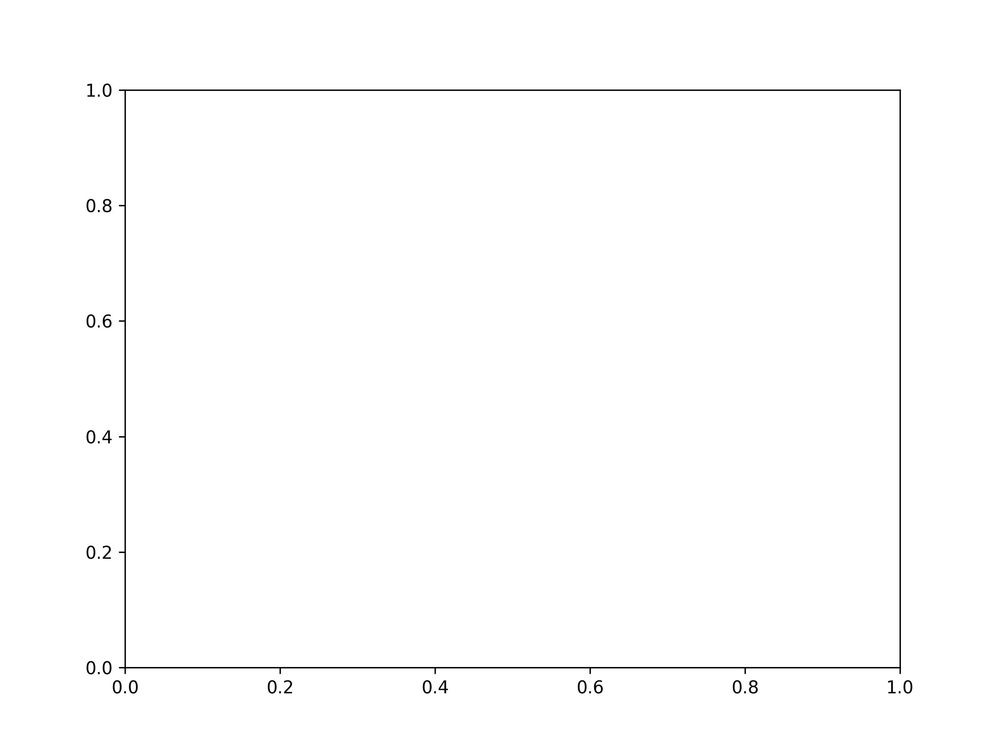

In [5]:
%matplotlib widget
fig = plt.figure(figsize=(8,6),dpi=300)
#projection='3d'
ax = plt.axes()

plt.rcParams["figure.autolayout"] = True


def replot():
    mas=pd.read_csv(r"D:\Prog\mcfluidic\_by_descriptors\x_y\t.csv")
    a=mas['t'].to_numpy()
    l=int(np.sqrt(len(a)))

    z=np.ndarray([l,l])
    for i in range(round(len(mas)/l)):
        for k in range(l):
            z[k][i]=a[l*i+k]
    X=np.linspace(mas['x'].min(),mas['x'].max(),l)
    Y=np.linspace(mas['y'].min(),mas['y'].max(),l)

    # Задаем сетку точек (x, y)
    X, Y = np.meshgrid(X,Y)

    # Отображаем поверхность
    ax.pcolor(Y,X,z, cmap='turbo',alpha=1)
    ax.set_xlabel('v AK')
    ax.set_ylabel('v ЦН')
    
def ad_points(data):
    l=len(data)-1
    x=data['x'][l]
    y=data['y'][l]
    ax.scatter(x,y,  alpha = 1,lw=2,color="red",edgecolors='black')  # creating new scatter chart with updated data
    ax.text(x,y,l, fontsize=10)
    #дорисовать линию меж точками
    ax.plot([x,data['x'][l-1]],[y,data['y'][l-1]],lw=0.5,c="black")

def update(frame,text_on,i):
    # updating the data by adding one more point
    
    next_point = optimizer.suggest(utility)
    target = target_function(next_point.get("x"),next_point.get('y'))


    optimizer.register(params=next_point, target=target)
   # optimizer.maximize(init_points=0, n_iter=1)
    l=len(optimizer.res)-1
    #optimizer.probe([2,2],lazy=False)
    x1=optimizer.res[l].get("params").get('x')
    y1=optimizer.res[l].get("params").get('y')
    z1=optimizer.res[l].get("target")
    t=str(round(z1,3))
    
    data.loc[ len(data.index )] = [l,x1,y1,z1]
    if len(data)>2:
        descr(data)
        replot()
        ad_points(data)


    ax.set_xlim(0.6,3)
    ax.set_ylim(0.6,3)
    fig.canvas.draw()
    fig.savefig('frame/'+str(i)+'.jpg')


In [6]:
aaa=0

Try predict by: ['x', 'y']
t - regression score: {'R2-score': -0.49999999999996003, 'MAE': 0.0005195433667241738, 'MAX': 0.0015586301001724798, 'RMSE': 0.0008998755079016346, 'R2-score interval': array([-22.15877357,   0.9028446 ]), 'RMSE interval': array([0.00050977, 0.00335523]), 'MAE interval': array([-0.00171587,  0.00275496])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



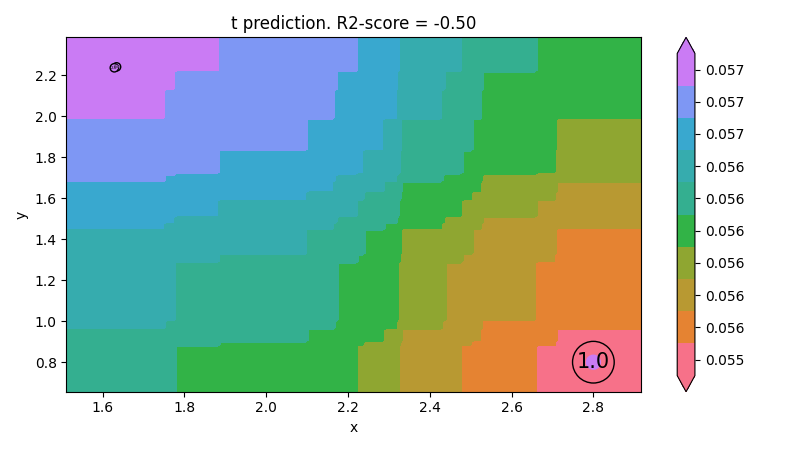

Try predict by: ['x', 'y']
t - regression score: {'R2-score': -0.7677414948159718, 'MAE': 0.0012753133995274009, 'MAX': 0.003542623497937082, 'RMSE': 0.0019351685351216598, 'R2-score interval': array([-15.97832602,   0.81594711]), 'RMSE interval': array([0.00115942, 0.00556081]), 'MAE interval': array([-0.00139899,  0.00394961])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



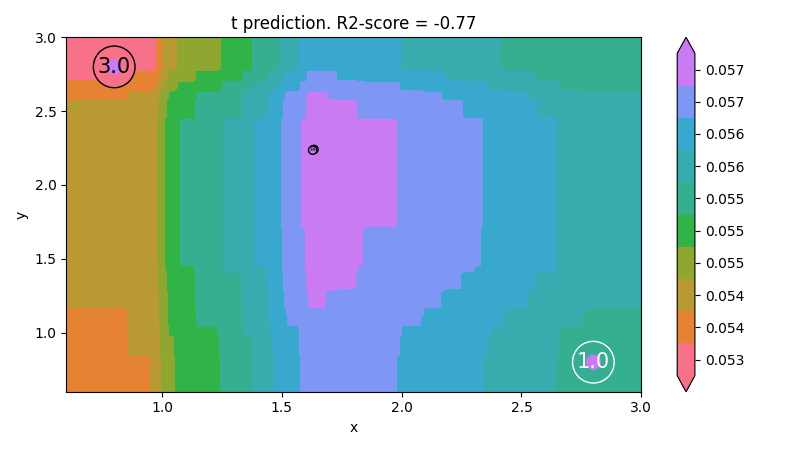

Try predict by: ['x', 'y']
t - regression score: {'R2-score': -0.7966349312082079, 'MAE': 0.00189056290057706, 'MAX': 0.003542623497937082, 'RMSE': 0.0024589934470810927, 'R2-score interval': array([-11.83943923,   0.74859517]), 'RMSE interval': array([0.00153492, 0.00603096]), 'MAE interval': array([-0.00029227,  0.00407339])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



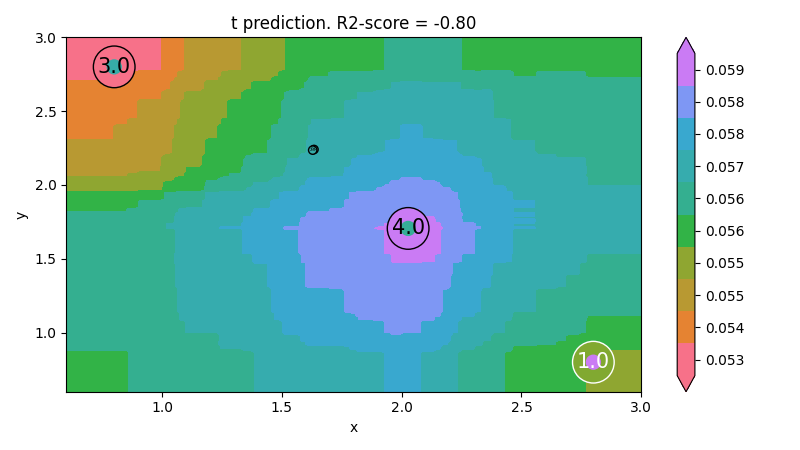

Try predict by: ['x', 'y']
t - regression score: {'R2-score': -0.8294947512124713, 'MAE': 0.0032756932414226003, 'MAX': 0.0075823802345274735, 'RMSE': 0.004629075532475116, 'R2-score interval': array([-9.64721411,  0.68564067]), 'RMSE interval': array([0.00298295, 0.01019353]), 'MAE interval': array([-0.00048442,  0.00703581])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



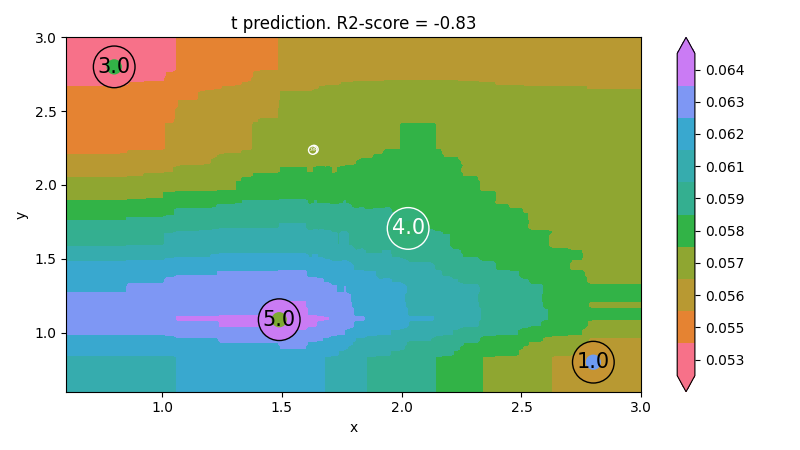

Try predict by: ['x', 'y']
t - regression score: {'R2-score': -0.09681882575623924, 'MAE': 0.0032901443982344966, 'MAX': 0.009198398739479259, 'RMSE': 0.004672805447799434, 'R2-score interval': array([-4.47851046,  0.78041266]), 'RMSE interval': array([0.00308954, 0.00951043]), 'MAE interval': array([-2.45046560e-05,  6.60479345e-03])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



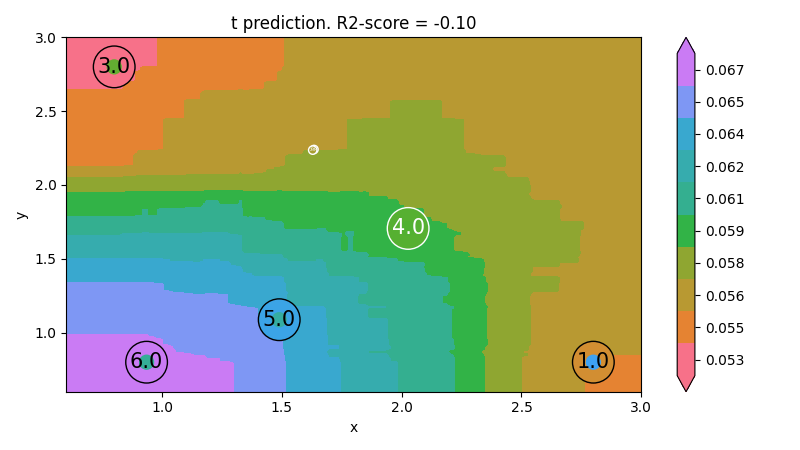

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.3825871589884149, 'MAE': 0.002615522606206547, 'MAX': 0.007307533397119238, 'RMSE': 0.003840991944572821, 'R2-score interval': array([-1.73715158,  0.86073164]), 'RMSE interval': array([0.00259443, 0.00735846]), 'MAE interval': array([0.00010153, 0.00512951])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



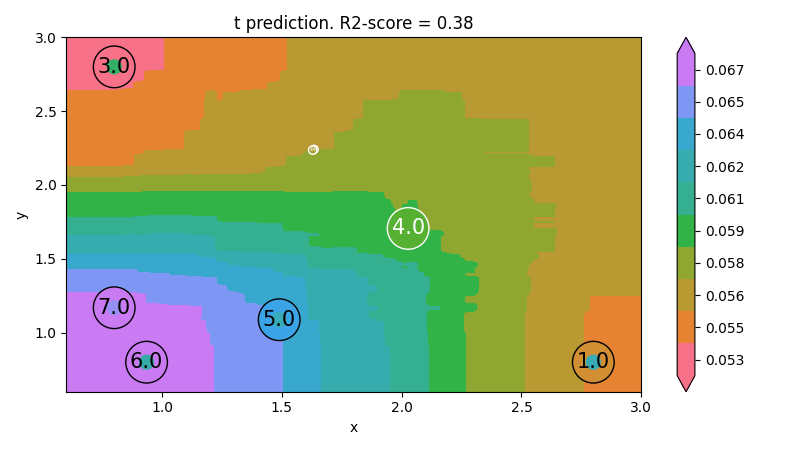

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.49802044798742984, 'MAE': 0.0027610554428435835, 'MAX': 0.007641167035175665, 'RMSE': 0.003906176740325533, 'R2-score interval': array([-1.02096674,  0.87531538]), 'RMSE interval': array([0.00268681, 0.00713116]), 'MAE interval': array([0.0005083 , 0.00501381])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



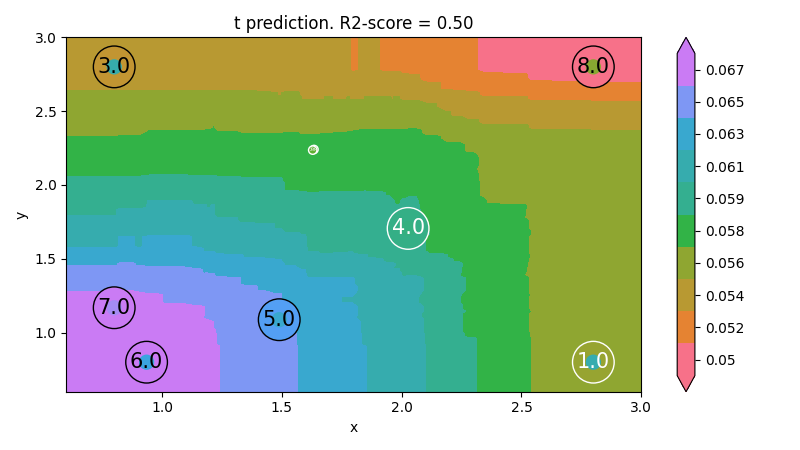

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.5849698974642121, 'MAE': 0.002292539868748664, 'MAX': 0.007478015199074643, 'RMSE': 0.003691596705283803, 'R2-score interval': array([-0.54258051,  0.88833647]), 'RMSE interval': array([0.00257938, 0.00647851]), 'MAE interval': array([0.00011071, 0.00447437])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



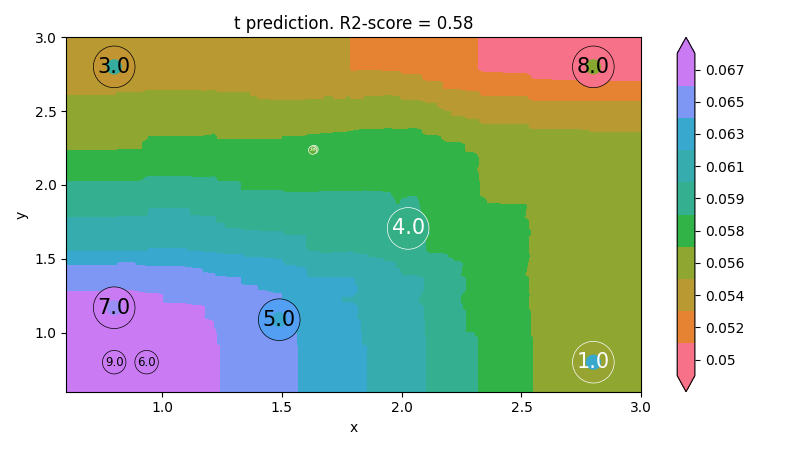

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.751968291222384, 'MAE': 0.0017239686959804297, 'MAX': 0.005882596973432866, 'RMSE': 0.0029008320599485347, 'R2-score interval': array([0.13841249, 0.92859724]), 'RMSE interval': array([0.00205494, 0.00492526]), 'MAE interval': array([8.01580574e-05, 3.36777933e-03])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



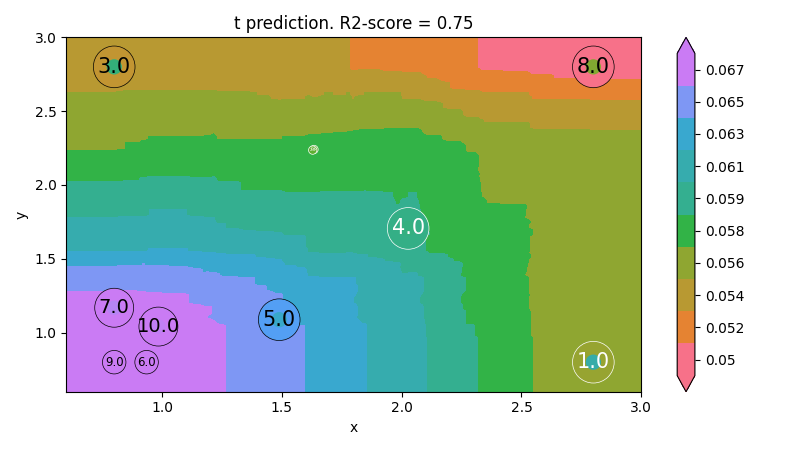

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.774679520237069, 'MAE': 0.0015755059924711285, 'MAX': 0.005882596973432866, 'RMSE': 0.002776469145287854, 'R2-score interval': array([0.26156235, 0.93124766]), 'RMSE interval': array([0.00199097, 0.00458322]), 'MAE interval': array([5.83549633e-05, 3.09265702e-03])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



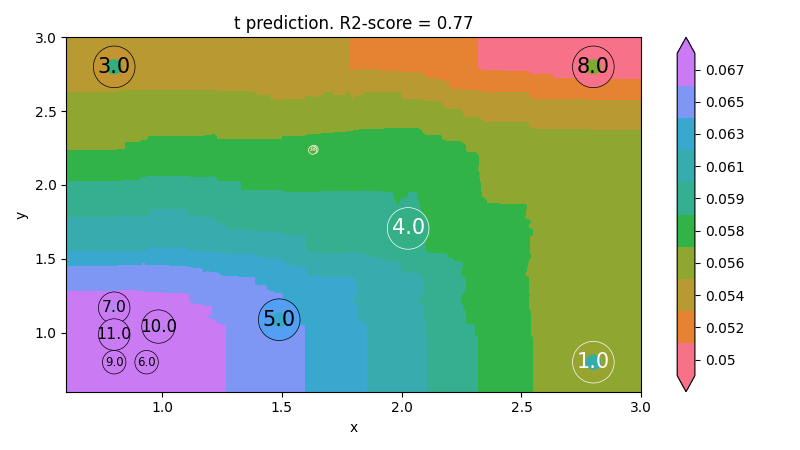

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8055800034873009, 'MAE': 0.0013722146637396527, 'MAX': 0.005616900211087586, 'RMSE': 0.0025546862858838422, 'R2-score interval': array([0.39437477, 0.93758659]), 'RMSE interval': array([0.00185203, 0.00411571]), 'MAE interval': array([1.68703506e-05, 2.72755898e-03])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



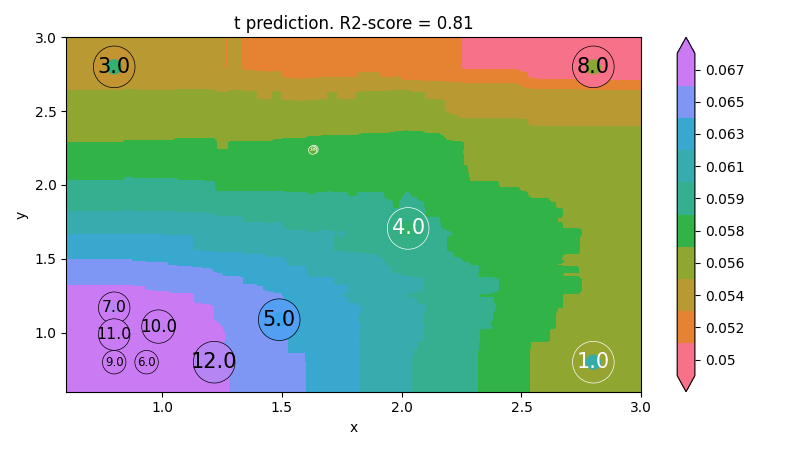

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8107041827918926, 'MAE': 0.0012817711393570453, 'MAX': 0.005616900211087586, 'RMSE': 0.0025045495131650673, 'R2-score interval': array([0.43616584, 0.93644779]), 'RMSE interval': array([0.00183365, 0.00394992]), 'MAE interval': array([-7.48367345e-06,  2.57102595e-03])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



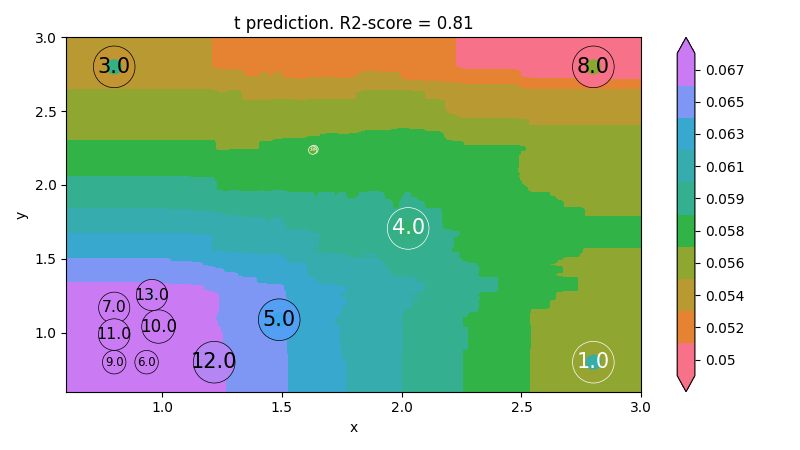

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7993022969985326, 'MAE': 0.0013666268814353866, 'MAX': 0.006312184968626851, 'RMSE': 0.002561346142258498, 'R2-score interval': array([0.4255846 , 0.92987728]), 'RMSE interval': array([0.00189208, 0.00396417]), 'MAE interval': array([0.00012487, 0.00260839])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



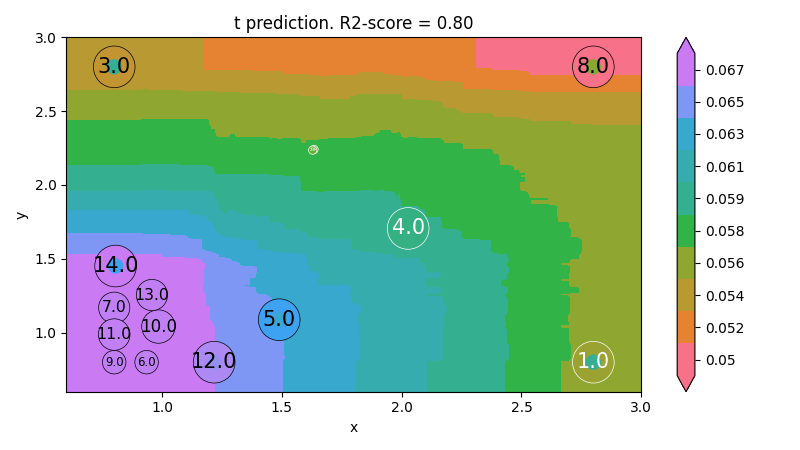

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7907227075598503, 'MAE': 0.0013165018288452562, 'MAX': 0.007299370409936078, 'RMSE': 0.0025895854050924203, 'R2-score interval': array([0.42211024, 0.92421221]), 'RMSE interval': array([0.00192865, 0.00394116]), 'MAE interval': array([8.926366e-05, 2.543740e-03])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



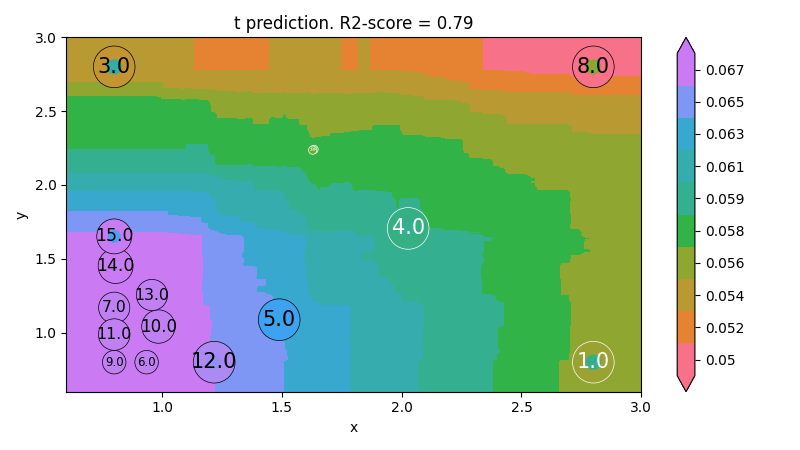

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7959566131299293, 'MAE': 0.0012355119020661387, 'MAX': 0.007553585856079903, 'RMSE': 0.002529092140754452, 'R2-score interval': array([0.45453074, 0.9236736 ]), 'RMSE interval': array([0.0018978 , 0.00379147]), 'MAE interval': array([6.59780215e-05, 2.40504578e-03])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



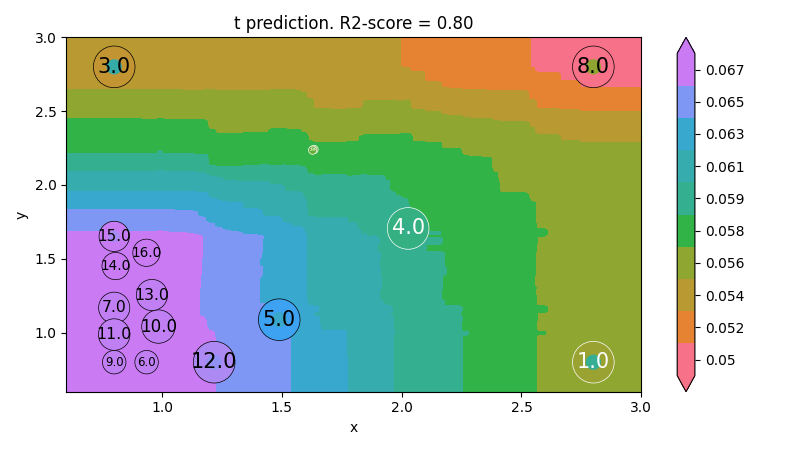

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8016794009959161, 'MAE': 0.0011395663448500182, 'MAX': 0.007800235770319831, 'RMSE': 0.002463642573982108, 'R2-score interval': array([0.48524059, 0.92359331]), 'RMSE interval': array([0.00186156, 0.0036433 ]), 'MAE interval': array([2.18766409e-05, 2.25725605e-03])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



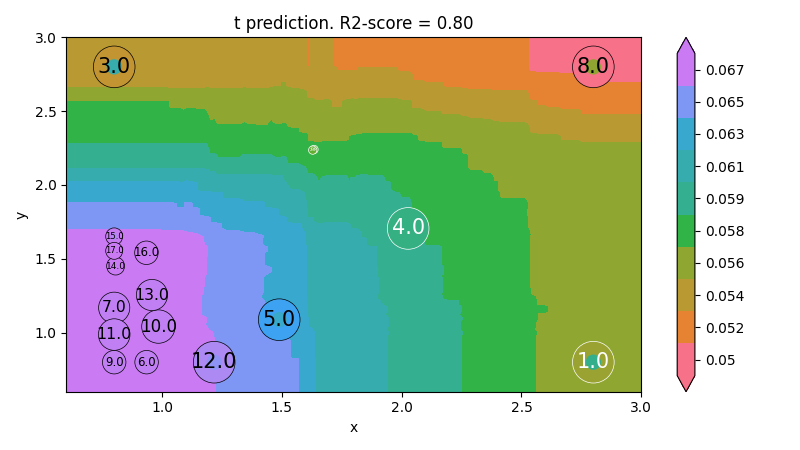

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8118467189559582, 'MAE': 0.0010898043272557496, 'MAX': 0.007887496096335746, 'RMSE': 0.0023828265568496625, 'R2-score interval': array([0.52463997, 0.92552664]), 'RMSE interval': array([0.00181212, 0.00348029]), 'MAE interval': array([4.04890596e-05, 2.13911959e-03])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



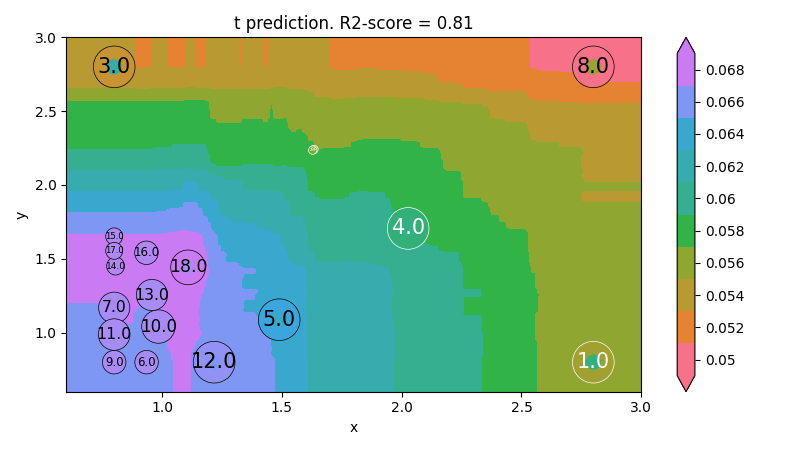

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8377620606858711, 'MAE': 0.0010067410418521019, 'MAX': 0.007139980821712084, 'RMSE': 0.002163576148275507, 'R2-score interval': array([0.60016715, 0.93416962]), 'RMSE interval': array([0.00165526, 0.00312435]), 'MAE interval': array([8.71716511e-05, 1.92631043e-03])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



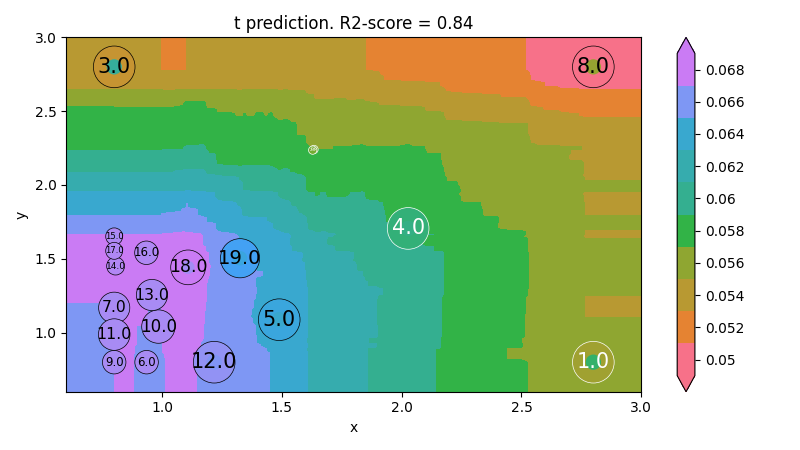

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8324170200230642, 'MAE': 0.0010908110901543169, 'MAX': 0.006646680993232255, 'RMSE': 0.002145937585336669, 'R2-score interval': array([0.5963614 , 0.93042277]), 'RMSE interval': array([0.00165098, 0.00306668]), 'MAE interval': array([0.00022883, 0.00195279])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



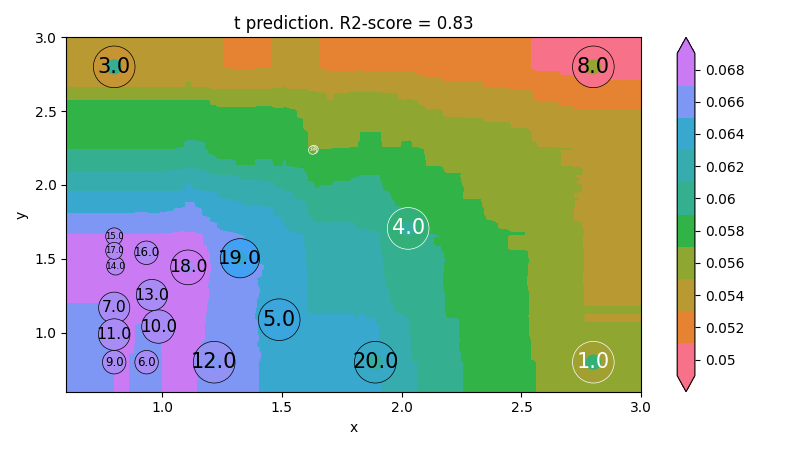

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8511926450829066, 'MAE': 0.000974436566424541, 'MAX': 0.006066120838736512, 'RMSE': 0.001995839671615616, 'R2-score interval': array([0.64912993, 0.93688938]), 'RMSE interval': array([0.00154357, 0.00282481]), 'MAE interval': array([0.00018399, 0.00176488])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



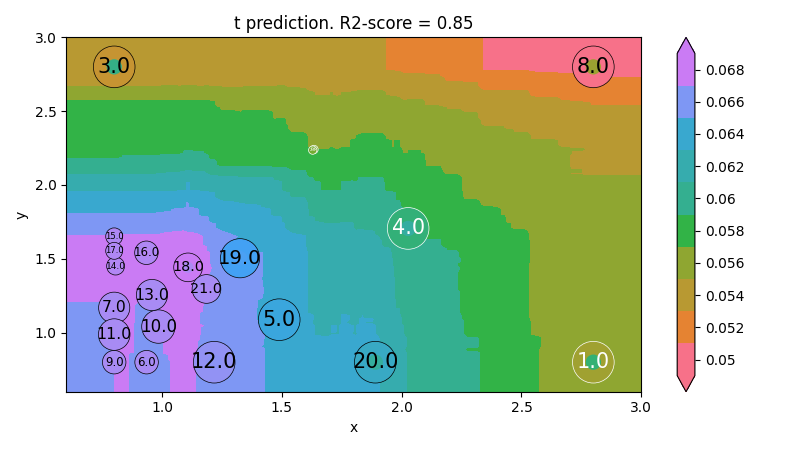

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.6849520224446315, 'MAE': 0.0014281380677501289, 'MAX': 0.010463691194433182, 'RMSE': 0.0028955778679506023, 'R2-score interval': array([0.27172231, 0.86371239]), 'RMSE interval': array([0.00225048, 0.0040618 ]), 'MAE interval': array([0.00031441, 0.00254187])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



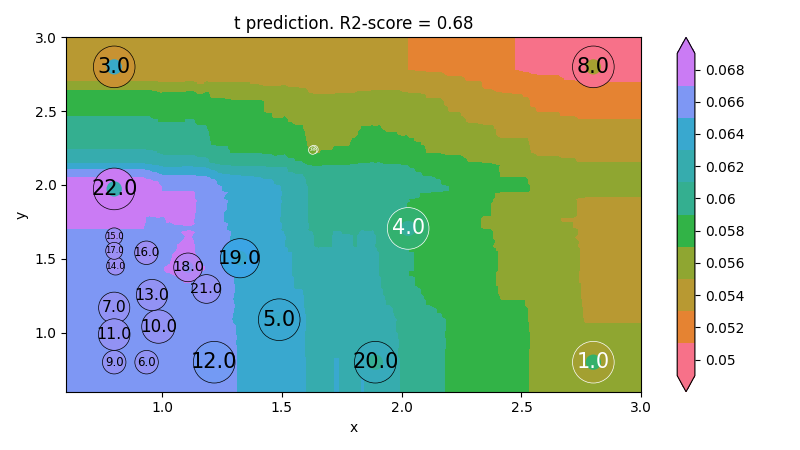

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.5514994177312434, 'MAE': 0.001469031678279135, 'MAX': 0.014594895797020953, 'RMSE': 0.0034469740885174774, 'R2-score interval': array([-0.01777218,  0.80235973]), 'RMSE interval': array([0.0026915 , 0.00479527]), 'MAE interval': array([0.00012398, 0.00281408])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



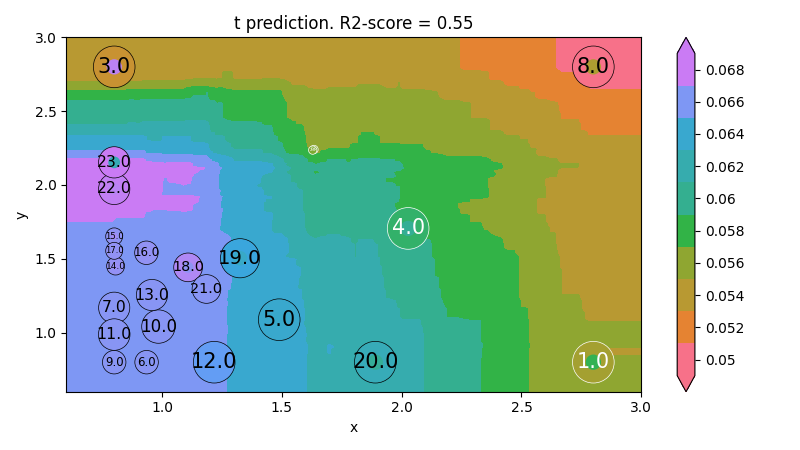

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.6344216673218505, 'MAE': 0.0013379086405759409, 'MAX': 0.01401955080116394, 'RMSE': 0.0031510583882303554, 'R2-score interval': array([0.18464988, 0.83608573]), 'RMSE interval': array([0.00247124, 0.00434975]), 'MAE interval': array([0.000136  , 0.00253982])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



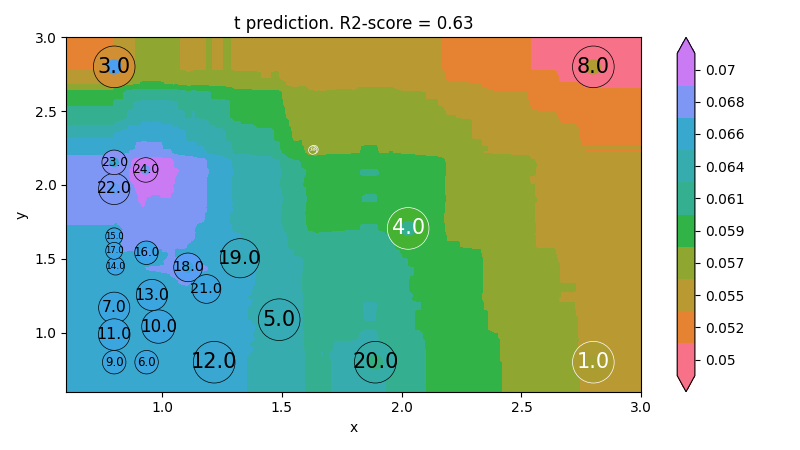

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.6505336933668839, 'MAE': 0.0012926834722684192, 'MAX': 0.01401955080116394, 'RMSE': 0.003080822782633258, 'R2-score interval': array([0.23316398, 0.84073948]), 'RMSE interval': array([0.0024262 , 0.00422206]), 'MAE interval': array([0.00014078, 0.00244459])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



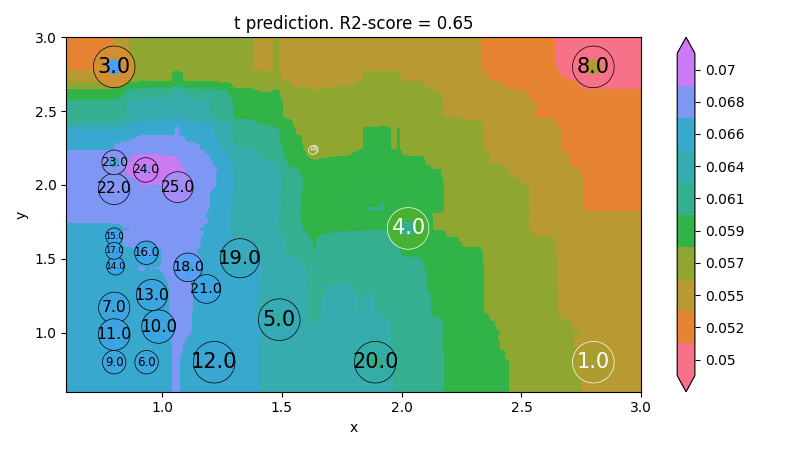

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.6817598845561479, 'MAE': 0.001245385698255015, 'MAX': 0.013383597115610761, 'RMSE': 0.002898248273565596, 'R2-score interval': array([0.31230084, 0.852731  ]), 'RMSE interval': array([0.00229141, 0.00394491]), 'MAE interval': array([0.0001904 , 0.00230037])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



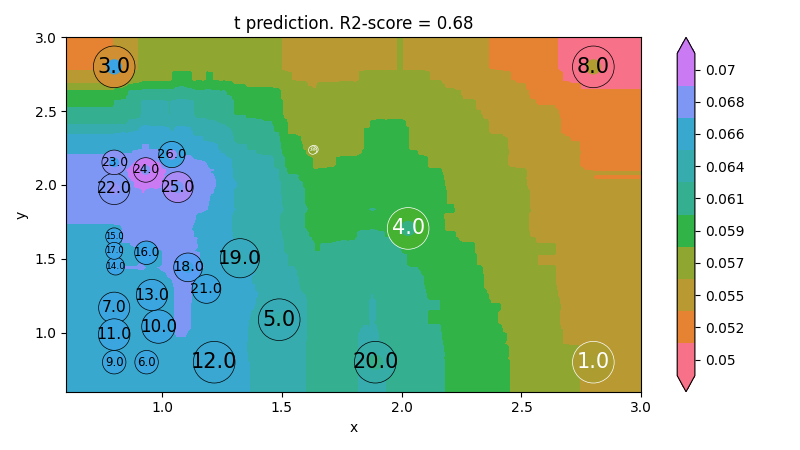

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.6757560106563549, 'MAE': 0.0013215680809519775, 'MAX': 0.014125897231595679, 'RMSE': 0.003014359457910427, 'R2-score interval': array([0.30938485, 0.84776736]), 'RMSE interval': array([0.00239213, 0.00407678]), 'MAE interval': array([0.00025177, 0.00239137])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



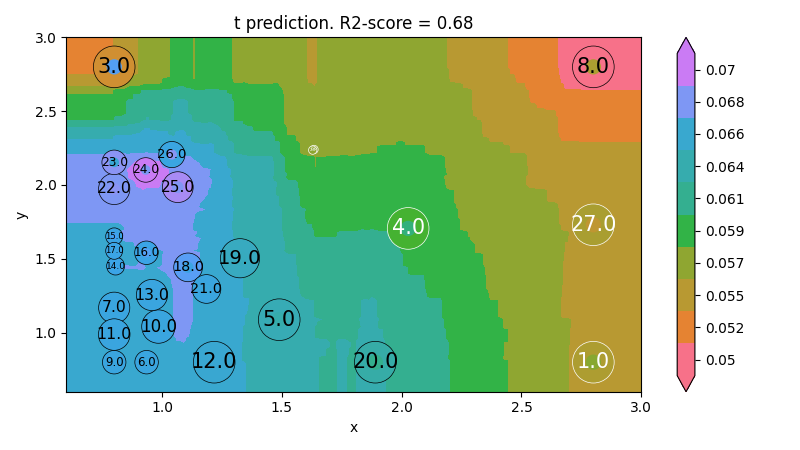

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.6707425754404022, 'MAE': 0.0013340470954548193, 'MAX': 0.014328775904783757, 'RMSE': 0.003019338457298046, 'R2-score interval': array([0.30823153, 0.84328506]), 'RMSE interval': array([0.00240462, 0.00405894]), 'MAE interval': array([0.0002855, 0.0023826])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



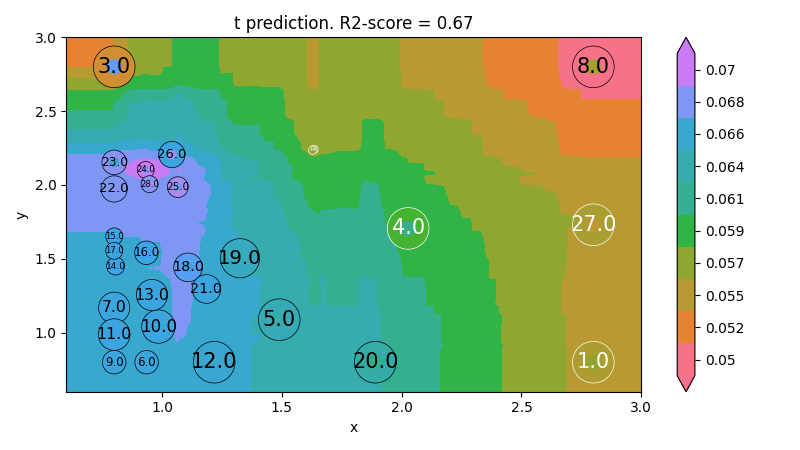

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7866398423784602, 'MAE': 0.0013122356338031362, 'MAX': 0.011114382349498637, 'RMSE': 0.0026659757006991525, 'R2-score interval': array([0.55750303, 0.89712346]), 'RMSE interval': array([0.00213041, 0.00356354]), 'MAE interval': array([0.00043087, 0.0021936 ])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



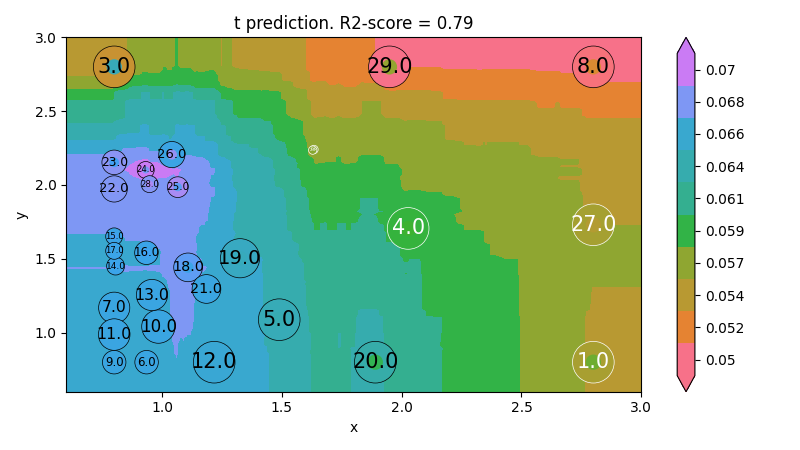

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7996943303884245, 'MAE': 0.0012411561852021275, 'MAX': 0.010395855349162465, 'RMSE': 0.002544570502831442, 'R2-score interval': array([0.58965741, 0.90222228]), 'RMSE interval': array([0.00203999, 0.00338295]), 'MAE interval': array([0.00041289, 0.00206942])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



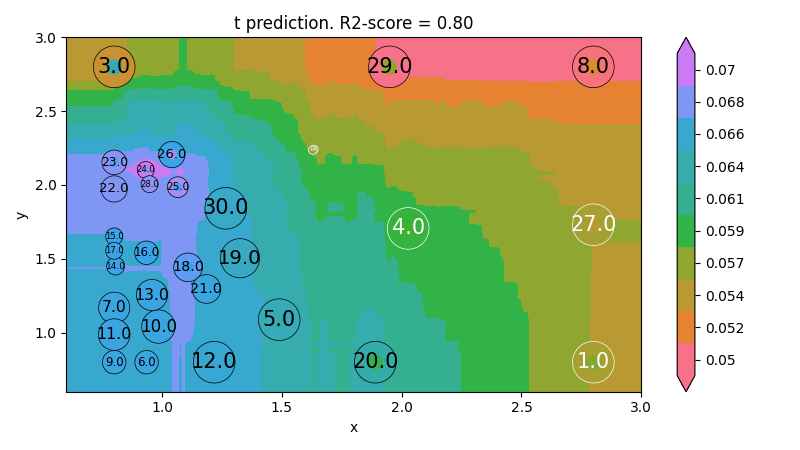

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7885241219797162, 'MAE': 0.0012624862810147383, 'MAX': 0.01090350804262629, 'RMSE': 0.0025949420754270637, 'R2-score interval': array([0.57181448, 0.89555451]), 'RMSE interval': array([0.00208682, 0.00343231]), 'MAE interval': array([0.00043202, 0.00209295])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



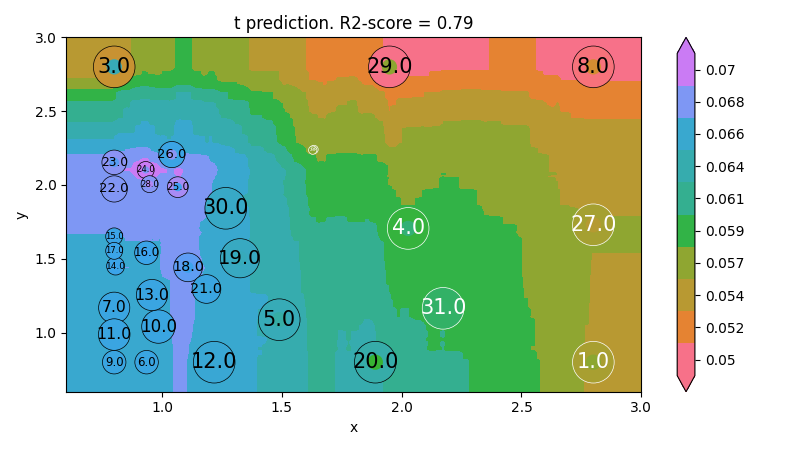

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7991924001205953, 'MAE': 0.0011799932575529918, 'MAX': 0.010438252261532673, 'RMSE': 0.0024906536662168046, 'R2-score interval': array([0.59792243, 0.89971166]), 'RMSE interval': array([0.0020089 , 0.00327839]), 'MAE interval': array([0.00039019, 0.0019698 ])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



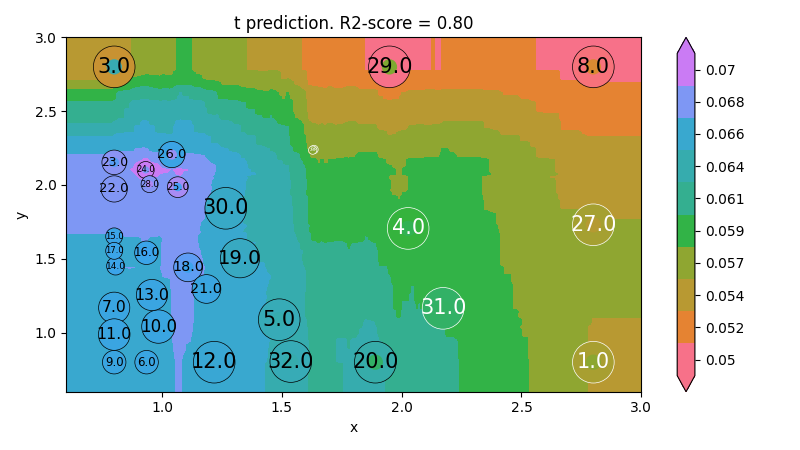

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8257729874746569, 'MAE': 0.0010689847506767205, 'MAX': 0.010523046086273101, 'RMSE': 0.0023194305763937105, 'R2-score interval': array([0.65483551, 0.91205627]), 'RMSE interval': array([0.00187612, 0.00303892]), 'MAE interval': array([0.00033997, 0.001798  ])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



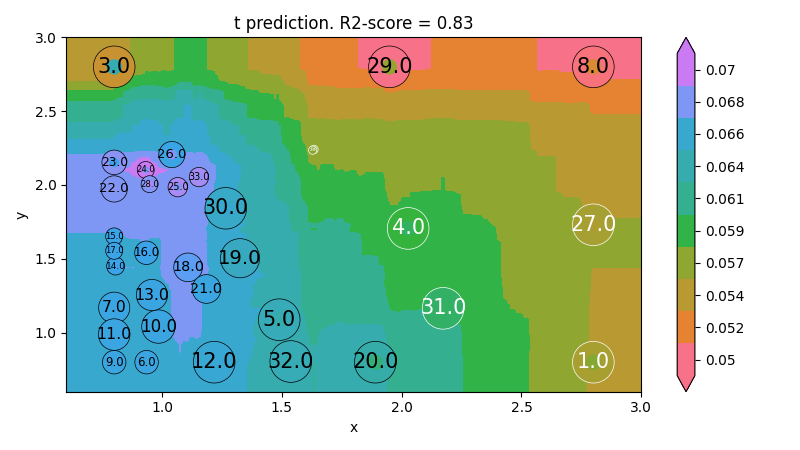

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7784147046888206, 'MAE': 0.0012013221059545645, 'MAX': 0.012722134254630556, 'RMSE': 0.002657929416337264, 'R2-score interval': array([0.56545142, 0.88700908]), 'RMSE interval': array([0.0021558, 0.0034671]), 'MAE interval': array([0.00037498, 0.00202766])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



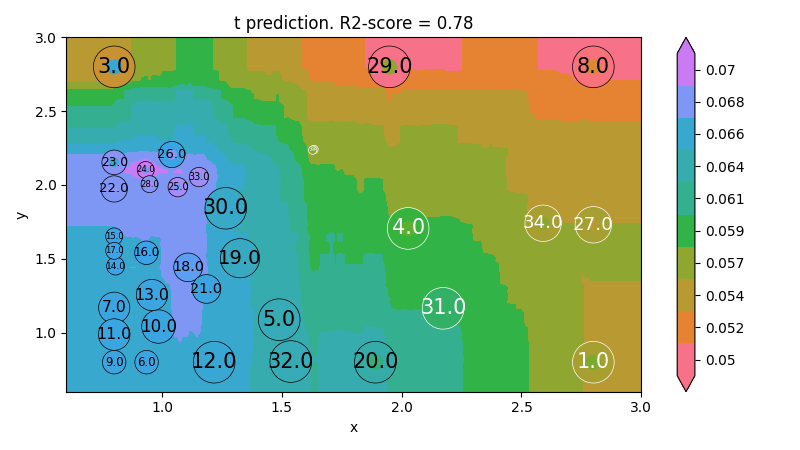

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7749179058533966, 'MAE': 0.001250120951544542, 'MAX': 0.012299275385907145, 'RMSE': 0.0026431372287128293, 'R2-score interval': array([0.56286444, 0.88410472]), 'RMSE interval': array([0.00214943, 0.00343333]), 'MAE interval': array([0.00045099, 0.00204926])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



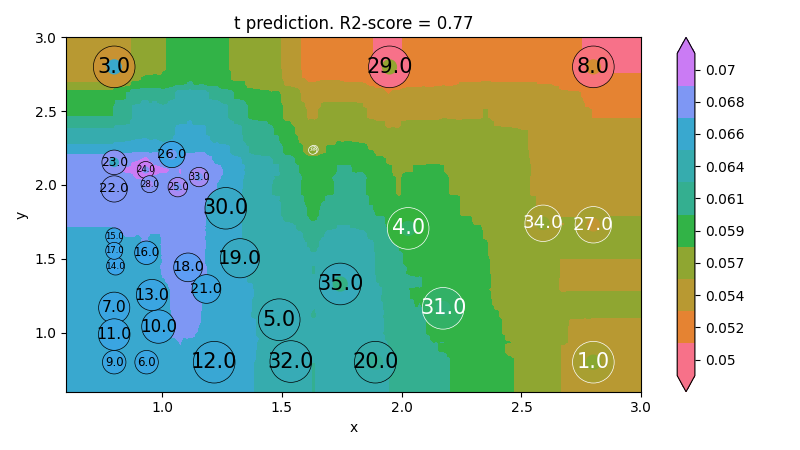

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7738727108710428, 'MAE': 0.0012096907885938621, 'MAX': 0.012637340429890127, 'RMSE': 0.0026321605324820733, 'R2-score interval': array([0.56490552, 0.88247713]), 'RMSE interval': array([0.00214591, 0.00340535]), 'MAE interval': array([0.00041951, 0.00199988])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



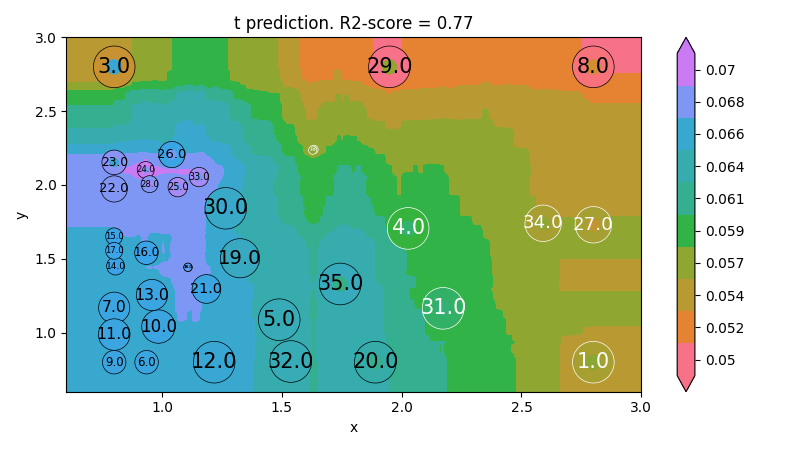

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.779143390081667, 'MAE': 0.0011994749427746993, 'MAX': 0.012552546605149699, 'RMSE': 0.0026223104487134445, 'R2-score interval': array([0.57882564, 0.88418658]), 'RMSE interval': array([0.00214307, 0.00337958]), 'MAE interval': array([0.00042271, 0.00197624])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



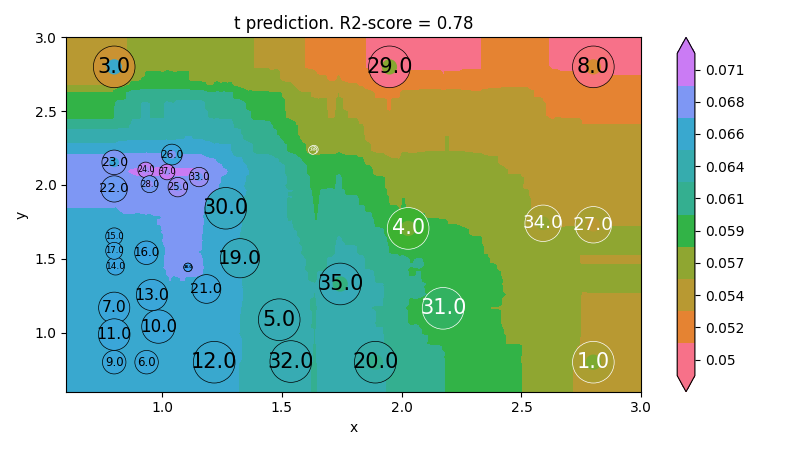

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7941440931300523, 'MAE': 0.001167658851860621, 'MAX': 0.012510149692779492, 'RMSE': 0.002554033981299741, 'R2-score interval': array([0.61078433, 0.89112295]), 'RMSE interval': array([0.00209217, 0.00327947]), 'MAE interval': array([0.0004217 , 0.00191362])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



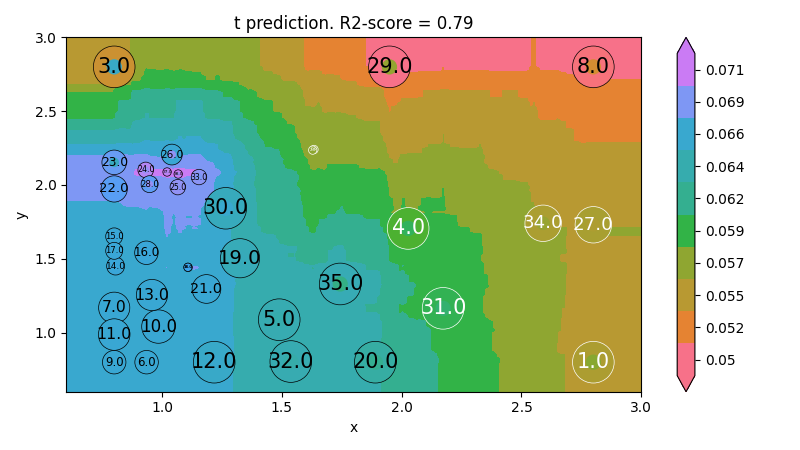

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.809817093408577, 'MAE': 0.0011933751313773, 'MAX': 0.012890611649132681, 'RMSE': 0.002567308713888578, 'R2-score interval': array([0.64336951, 0.89857979]), 'RMSE interval': array([0.00210779, 0.00328488]), 'MAE interval': array([0.00045715, 0.00192961])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



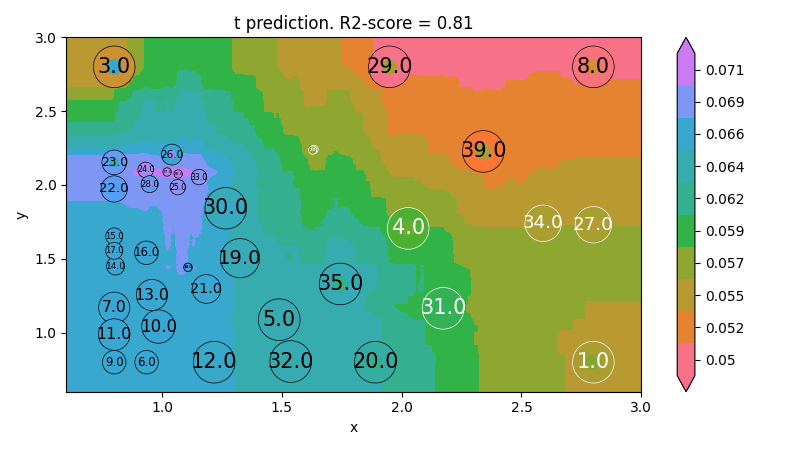

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7969008442193906, 'MAE': 0.00128564155093217, 'MAX': 0.012890611649132681, 'RMSE': 0.0026205934994676626, 'R2-score interval': array([0.62215773, 0.8908294 ]), 'RMSE interval': array([0.00215624, 0.00334169]), 'MAE interval': array([0.00055591, 0.00201538])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



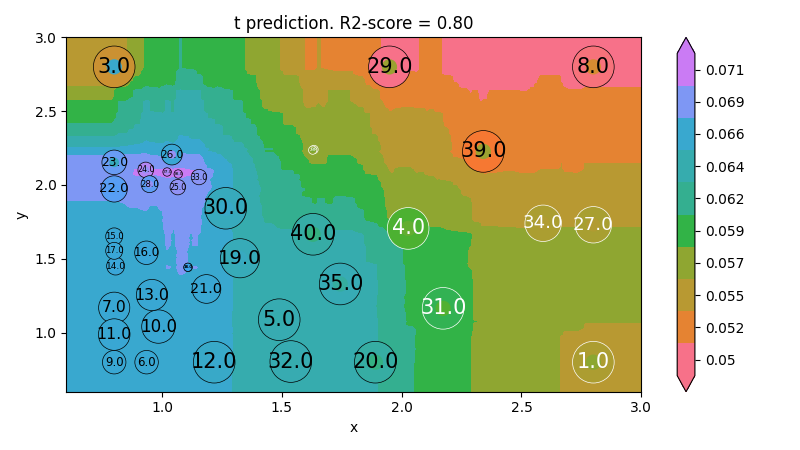

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7907022608272001, 'MAE': 0.0013180129442309325, 'MAX': 0.013355867430226313, 'RMSE': 0.0026761854047582124, 'R2-score interval': array([0.61358899, 0.88663485]), 'RMSE interval': array([0.00220662, 0.00340146]), 'MAE interval': array([0.00058341, 0.00205262])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



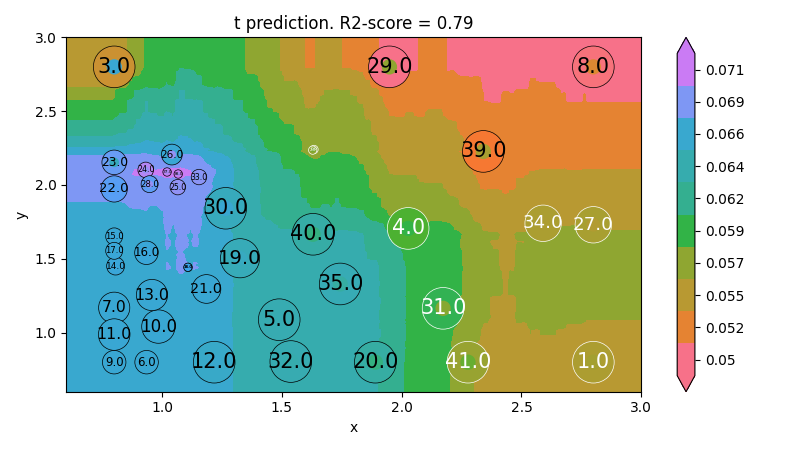

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7977546614807627, 'MAE': 0.0012302206908900418, 'MAX': 0.01339826434259652, 'RMSE': 0.0026001899596208413, 'R2-score interval': array([0.62934873, 0.88964512]), 'RMSE interval': array([0.00214834, 0.00329451]), 'MAE interval': array([0.00051689, 0.00194355])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



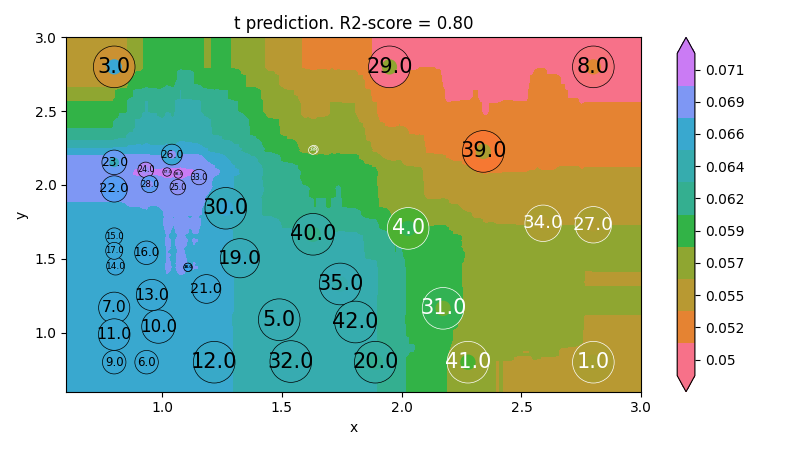

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7934472986222698, 'MAE': 0.0012526748980496052, 'MAX': 0.013483058167336949, 'RMSE': 0.002643282924763306, 'R2-score interval': array([0.6241346 , 0.88649123]), 'RMSE interval': array([0.00218825, 0.00333899]), 'MAE interval': array([0.00053684, 0.00196851])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



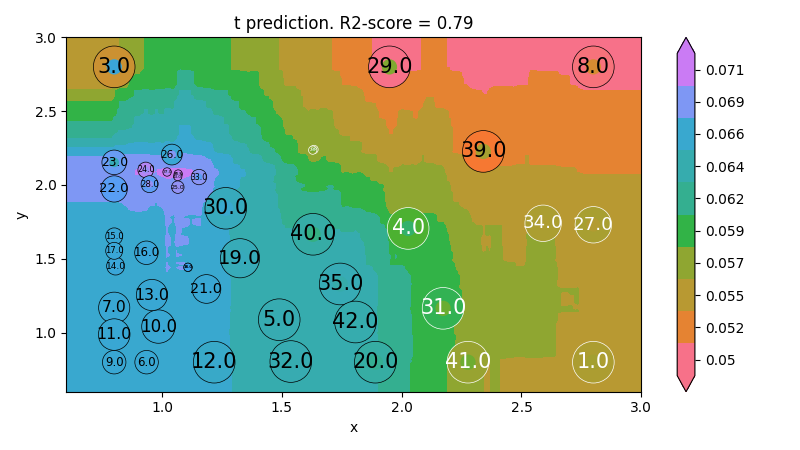

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.7974006994334246, 'MAE': 0.0012311992910834697, 'MAX': 0.013440661254966728, 'RMSE': 0.0026069785811584666, 'R2-score interval': array([0.63384923, 0.88789734]), 'RMSE interval': array([0.00216233, 0.00328355]), 'MAE interval': array([0.00053302, 0.00192938])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



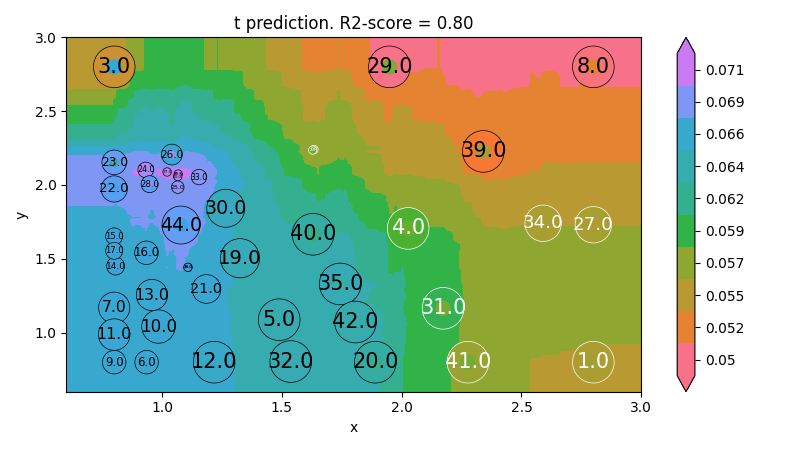

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9054682010349807, 'MAE': 0.0010192867542742324, 'MAX': 0.007261382482493459, 'RMSE': 0.0018748120411742077, 'R2-score interval': array([0.83028487, 0.94734553]), 'RMSE interval': array([0.00155792, 0.00235474]), 'MAE interval': array([0.00054684, 0.00149173])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



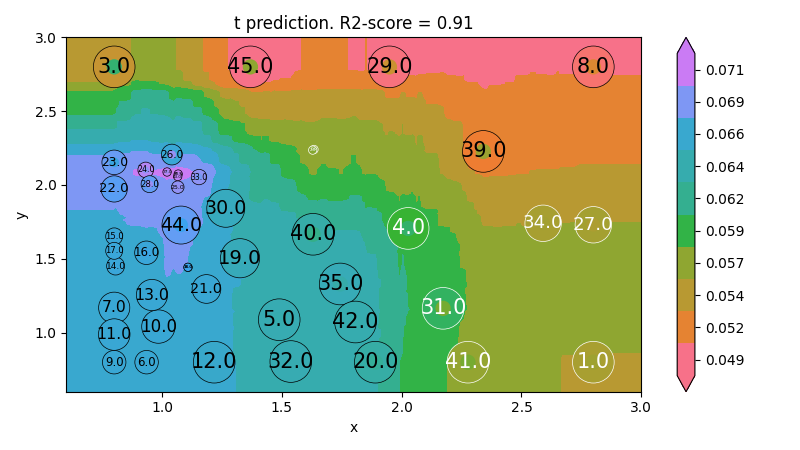

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8940029525711739, 'MAE': 0.0010548607175437, 'MAX': 0.007848066195311275, 'RMSE': 0.001994661408953461, 'R2-score interval': array([0.81091736, 0.94057956]), 'RMSE interval': array([0.00166049, 0.00249847]), 'MAE interval': array([0.00055243, 0.00155729])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



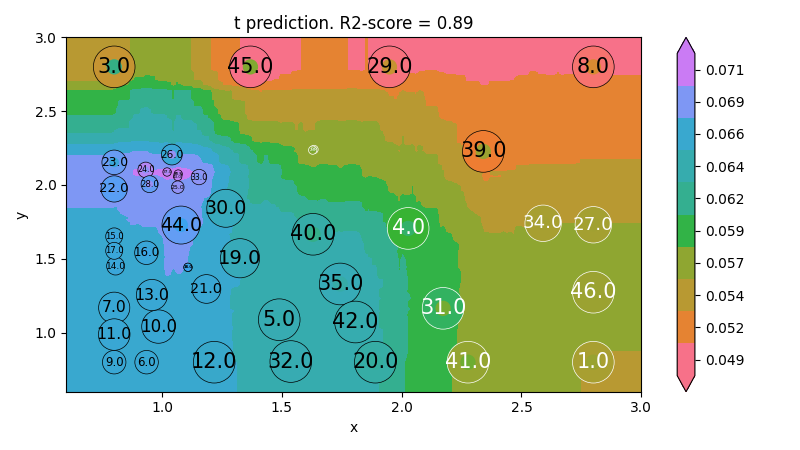

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8884483053789743, 'MAE': 0.0010402379900590422, 'MAX': 0.008597720178062936, 'RMSE': 0.0020290138709387574, 'R2-score interval': array([0.80223981, 0.93707641]), 'RMSE interval': array([0.00169204, 0.00253484]), 'MAE interval': array([0.00052904, 0.00155143])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



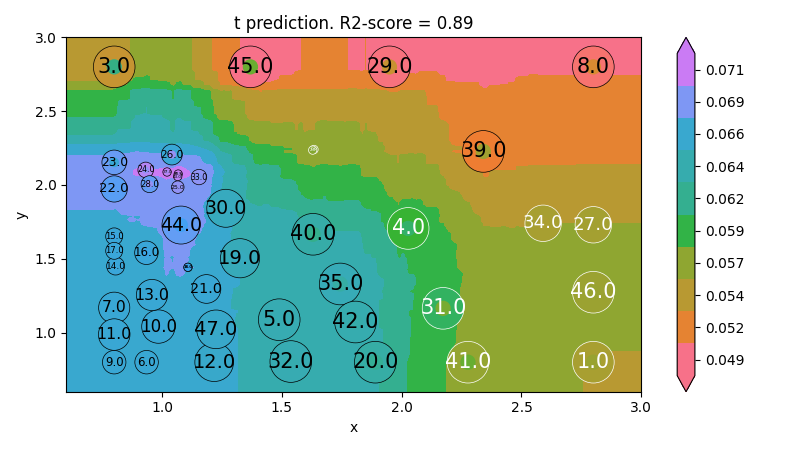

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8807669241133819, 'MAE': 0.0010846988112962455, 'MAX': 0.008585732451408756, 'RMSE': 0.0021155304462567143, 'R2-score interval': array([0.78988884, 0.93233807]), 'RMSE interval': array([0.00176717, 0.00263623]), 'MAE interval': array([0.00055759, 0.0016118 ])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



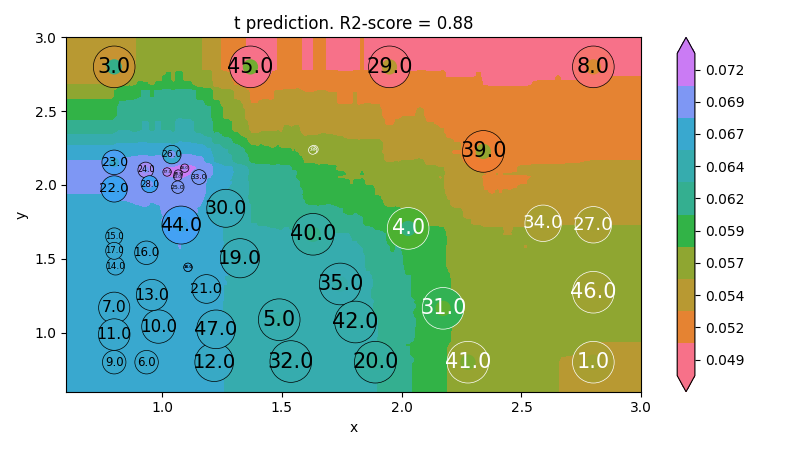

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8868332042004499, 'MAE': 0.0010832451506110367, 'MAX': 0.008674750147125439, 'RMSE': 0.002092357061528116, 'R2-score interval': array([0.80173706, 0.93540536]), 'RMSE interval': array([0.00175069, 0.00260096]), 'MAE interval': array([0.00056933, 0.00159716])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



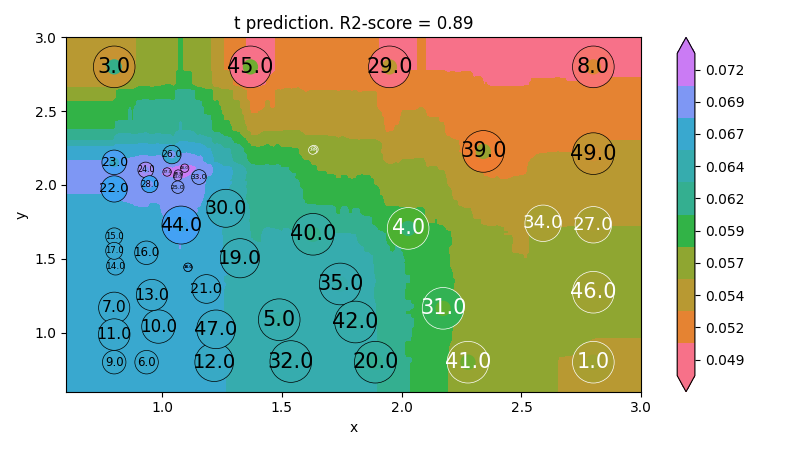

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8823057308805744, 'MAE': 0.001044496399717822, 'MAX': 0.009425161509748904, 'RMSE': 0.002143879553931962, 'R2-score interval': array([0.79496668, 0.93244054]), 'RMSE interval': array([0.00179667, 0.00265868]), 'MAE interval': array([0.00051268, 0.00157631])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



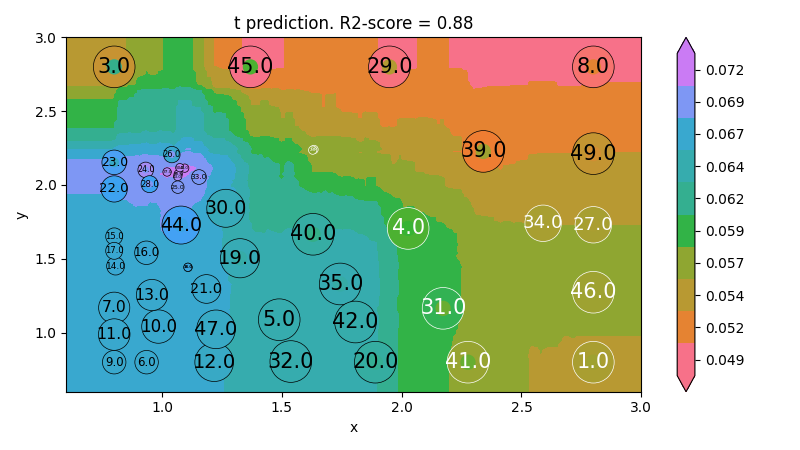

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8890698315939911, 'MAE': 0.0009812172546898154, 'MAX': 0.009137235137543609, 'RMSE': 0.002061252835710708, 'R2-score interval': array([0.80780678, 0.93597328]), 'RMSE interval': array([0.00173012, 0.00255033]), 'MAE interval': array([0.00047163, 0.00149081])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



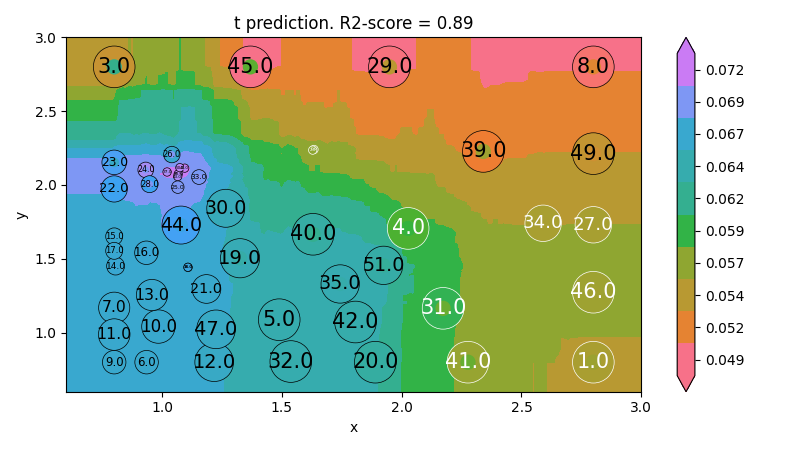

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.8898197689724368, 'MAE': 0.0010252742745289528, 'MAX': 0.00895965185437849, 'RMSE': 0.0020619242032480943, 'R2-score interval': array([0.81011945, 0.93606674]), 'RMSE interval': array([0.0017333 , 0.00254547]), 'MAE interval': array([0.00052746, 0.00152309])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



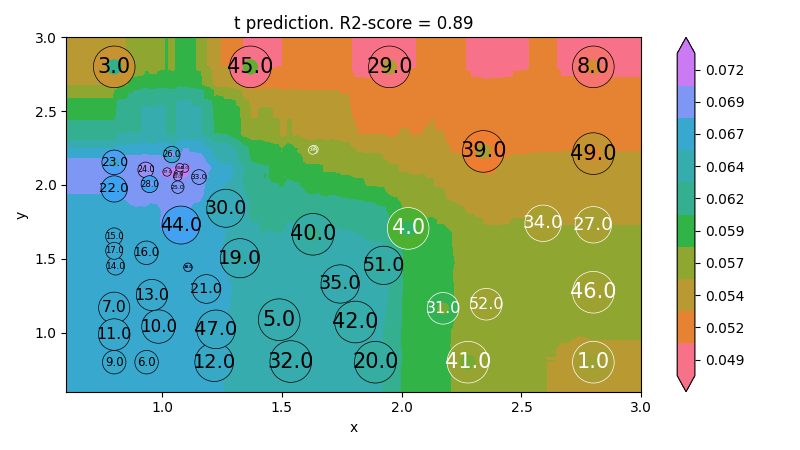

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.897985726589027, 'MAE': 0.0011087222928276188, 'MAX': 0.007823753115964158, 'RMSE': 0.0019762391657378235, 'R2-score interval': array([0.8250991 , 0.94049824]), 'RMSE interval': array([0.00166373, 0.00243442]), 'MAE interval': array([0.00065801, 0.00155944])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



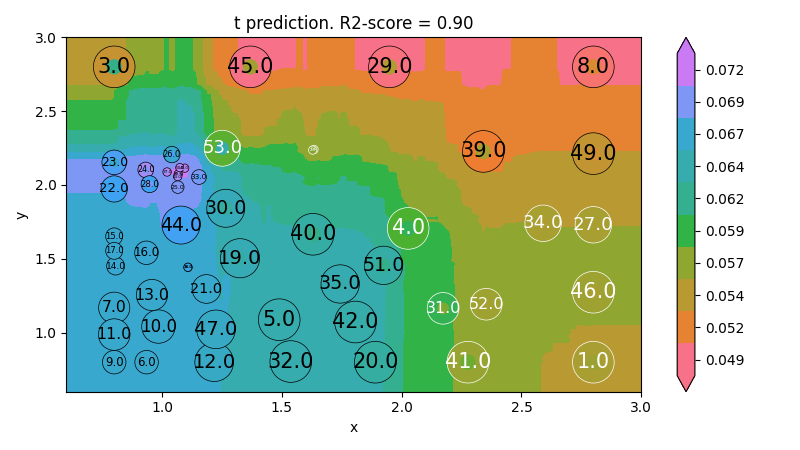

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9009895400849918, 'MAE': 0.0010457600903226554, 'MAX': 0.007584715683131502, 'RMSE': 0.0019322734089842824, 'R2-score interval': array([0.83110015, 0.94195927]), 'RMSE interval': array([0.00162905, 0.00237526]), 'MAE interval': array([0.00060246, 0.00148906])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



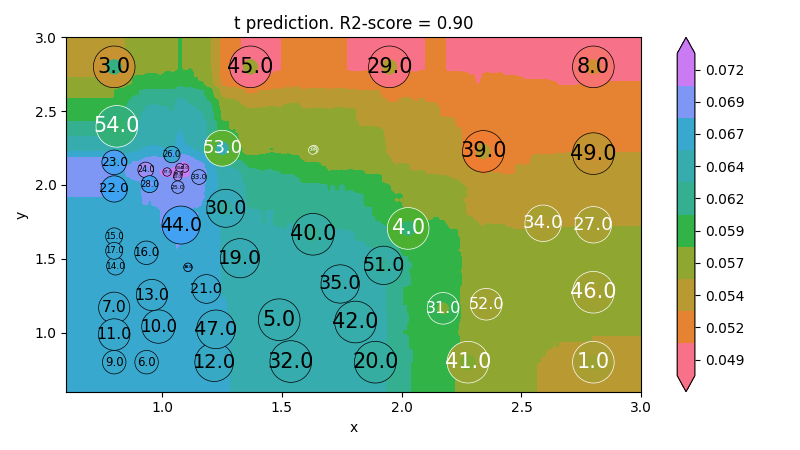

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9028508590447046, 'MAE': 0.0010200432872948281, 'MAX': 0.007584715683131502, 'RMSE': 0.0018981028762588446, 'R2-score interval': array([0.83508348, 0.94277131]), 'RMSE interval': array([0.00160248, 0.00232849]), 'MAE interval': array([0.00058749, 0.0014526 ])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



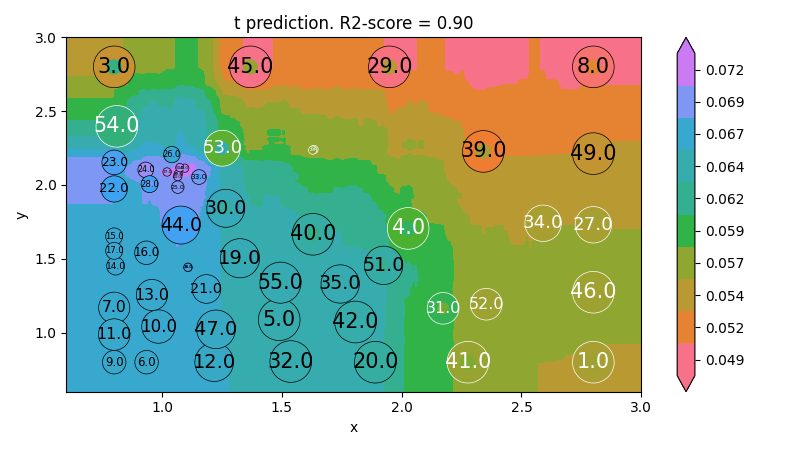

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9471514402501507, 'MAE': 0.0008566959283853133, 'MAX': 0.005687345680811959, 'RMSE': 0.0014487397108636938, 'R2-score interval': array([0.9107121, 0.9687195]), 'RMSE interval': array([0.00122478, 0.00177371]), 'MAE interval': array([0.00054395, 0.00116944])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



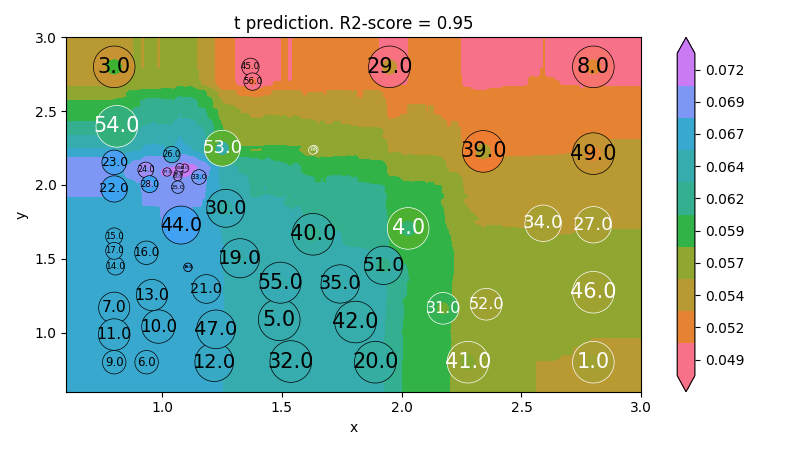

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9395677939367081, 'MAE': 0.0008988367634153078, 'MAX': 0.006441646201532668, 'RMSE': 0.0015403049298725274, 'R2-score interval': array([0.89837119, 0.9640648 ]), 'RMSE interval': array([0.00130392, 0.00188218]), 'MAE interval': array([0.00056707, 0.0012306 ])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



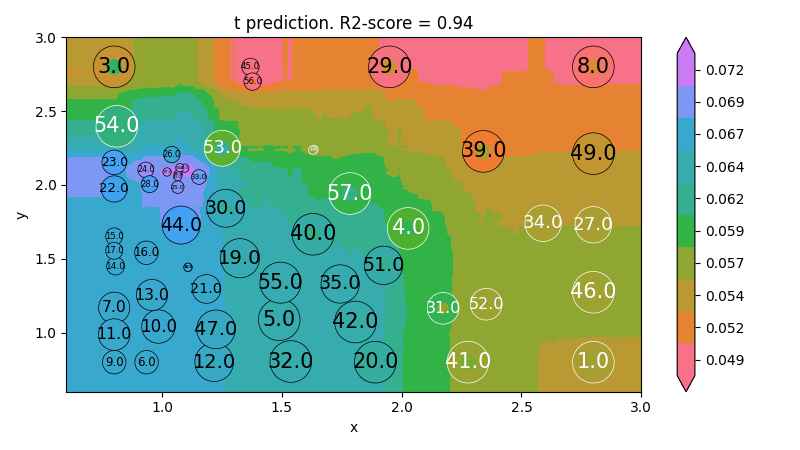

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9380344157954461, 'MAE': 0.0009071086789765065, 'MAX': 0.006527219741234401, 'RMSE': 0.0015541728710643057, 'R2-score interval': array([0.89626143, 0.96298644]), 'RMSE interval': array([0.00131737, 0.00189557]), 'MAE interval': array([0.00057541, 0.00123881])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



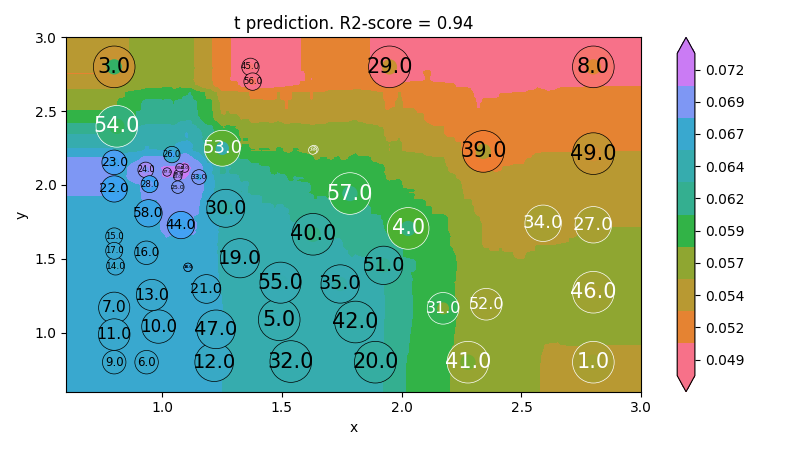

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9486914400567245, 'MAE': 0.0008239350299339015, 'MAX': 0.0052941400293514615, 'RMSE': 0.0014059941215274427, 'R2-score interval': array([0.91447937, 0.96921716]), 'RMSE interval': array([0.00119328, 0.00171171]), 'MAE interval': array([0.00052715, 0.00112072])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



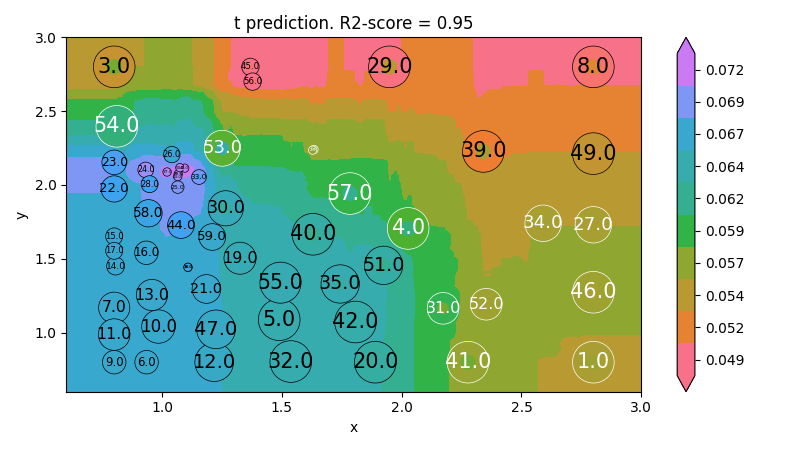

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.956074004900522, 'MAE': 0.0008053227583951885, 'MAX': 0.00511254860180136, 'RMSE': 0.0013387460756709945, 'R2-score interval': array([0.92709755, 0.97353322]), 'RMSE interval': array([0.00113762, 0.00162694]), 'MAE interval': array([0.00052915, 0.00108149])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



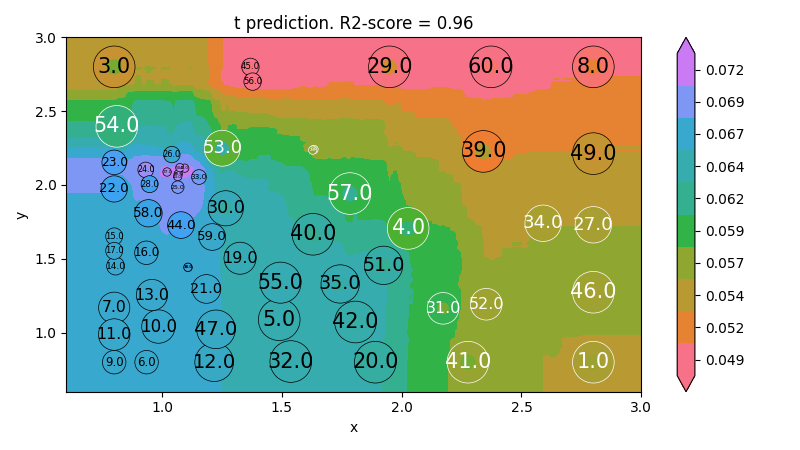

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9574419621445912, 'MAE': 0.0007866190634413999, 'MAX': 0.005312848464308122, 'RMSE': 0.001312753085348112, 'R2-score interval': array([0.92966241, 0.97425009]), 'RMSE interval': array([0.00111688, 0.00159259]), 'MAE interval': array([0.00051754, 0.0010557 ])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



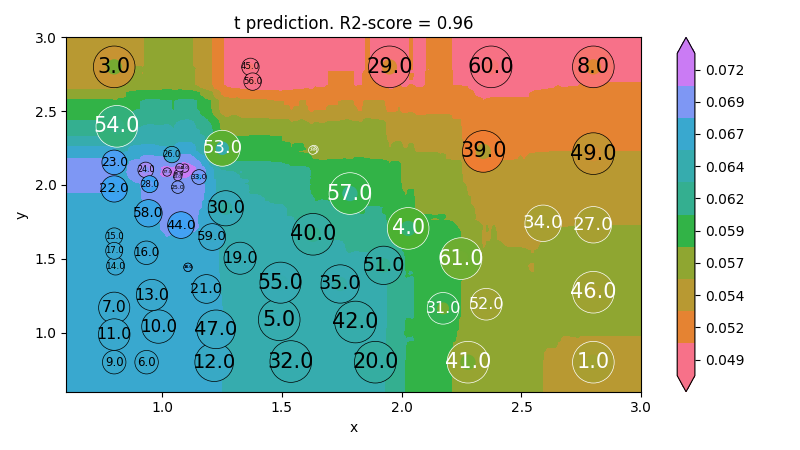

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9405786732771734, 'MAE': 0.0009082409519788248, 'MAX': 0.0064797407665563925, 'RMSE': 0.0015450391004261383, 'R2-score interval': array([0.90219122, 0.96390003]), 'RMSE interval': array([0.00131606, 0.00187123]), 'MAE interval': array([0.00059093, 0.00122555])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



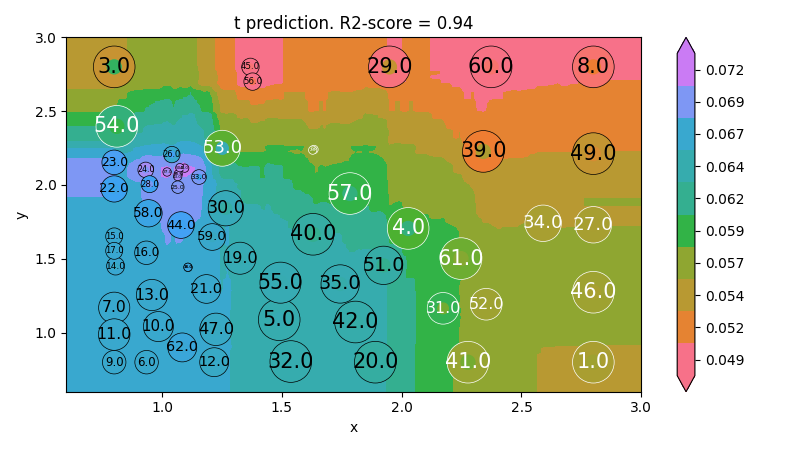

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9501788540317241, 'MAE': 0.0008610975290463336, 'MAX': 0.005751666477283986, 'RMSE': 0.0014126986305191588, 'R2-score interval': array([0.91831897, 0.96961171]), 'RMSE interval': array([0.00120473, 0.00170813]), 'MAE interval': array([0.00057914, 0.00114306])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



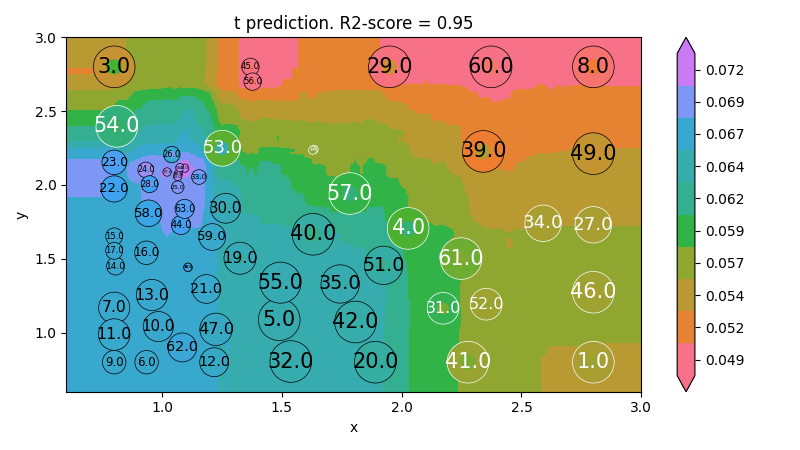

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9511460747349904, 'MAE': 0.0008337810587892179, 'MAX': 0.006052877240654508, 'RMSE': 0.0014009314217910674, 'R2-score interval': array([0.92021529, 0.97008567]), 'RMSE interval': array([0.00119604, 0.00169119]), 'MAE interval': array([0.00055265, 0.00111491])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



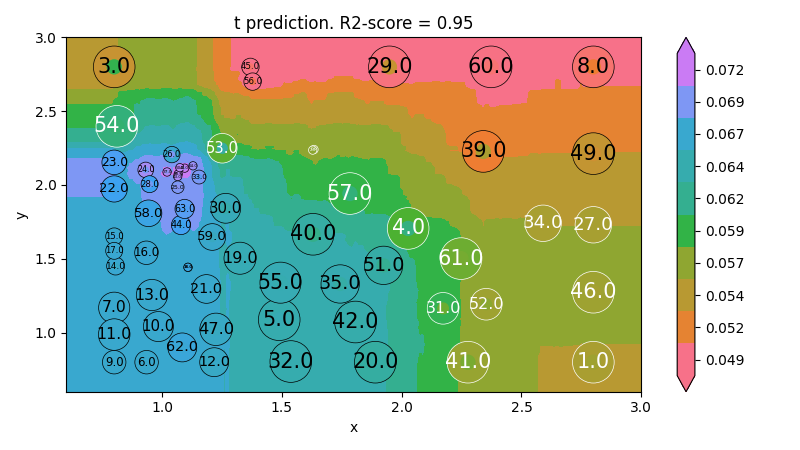

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9506208028930099, 'MAE': 0.0008537724861411663, 'MAX': 0.006332835260795318, 'RMSE': 0.001398956885831145, 'R2-score interval': array([0.91966291, 0.96964907]), 'RMSE interval': array([0.00119568, 0.00168616]), 'MAE interval': array([0.00057925, 0.00112829])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



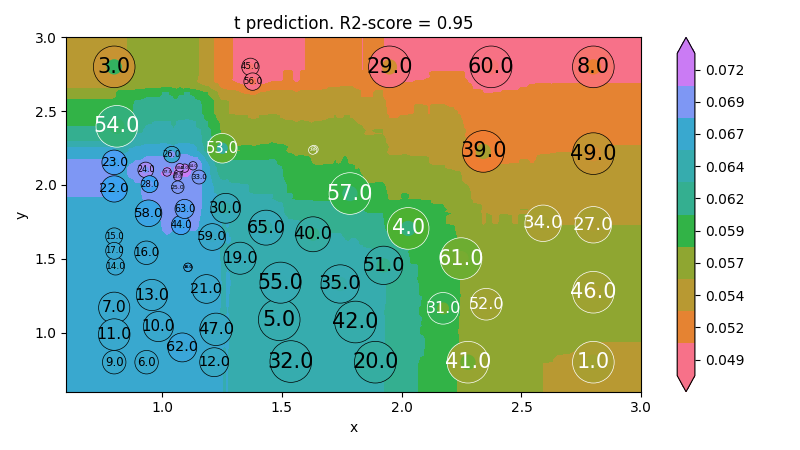

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9523058915547539, 'MAE': 0.0008223789675206713, 'MAX': 0.006052877240654508, 'RMSE': 0.00136458495633258, 'R2-score interval': array([0.92269166, 0.97057591]), 'RMSE interval': array([0.00116757, 0.00164222]), 'MAE interval': array([0.00055476, 0.00109   ])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



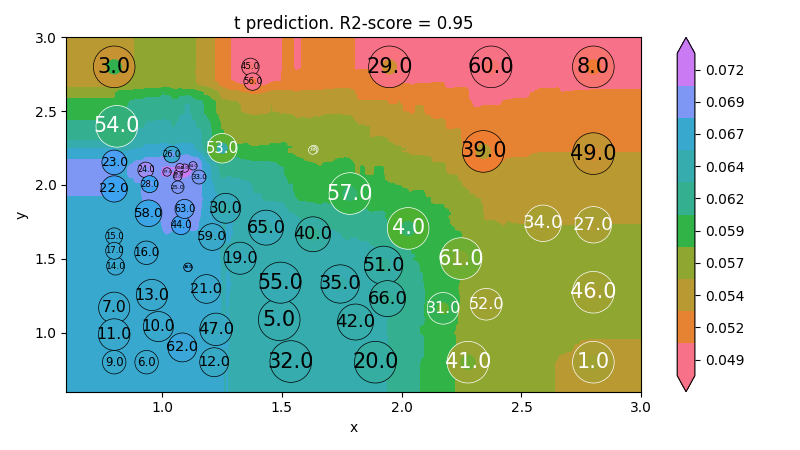

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9546161456812218, 'MAE': 0.0007634721447176387, 'MAX': 0.006418408800497065, 'RMSE': 0.0013221958551450088, 'R2-score interval': array([0.92670256, 0.97189951]), 'RMSE interval': array([0.0011325 , 0.00158883]), 'MAE interval': array([0.00050024, 0.00102671])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



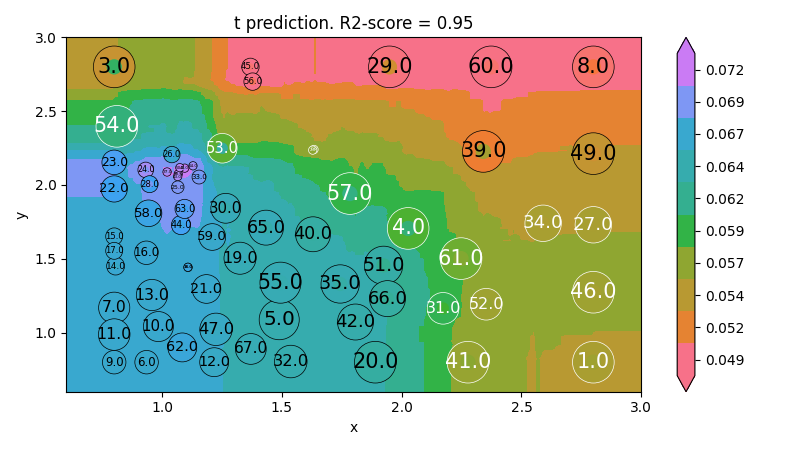

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9558811046728787, 'MAE': 0.0007851649117075091, 'MAX': 0.005578534740074623, 'RMSE': 0.0012941608073627155, 'R2-score interval': array([0.92899764, 0.97258574]), 'RMSE interval': array([0.00110964, 0.00155287]), 'MAE interval': array([0.00053622, 0.00103411])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



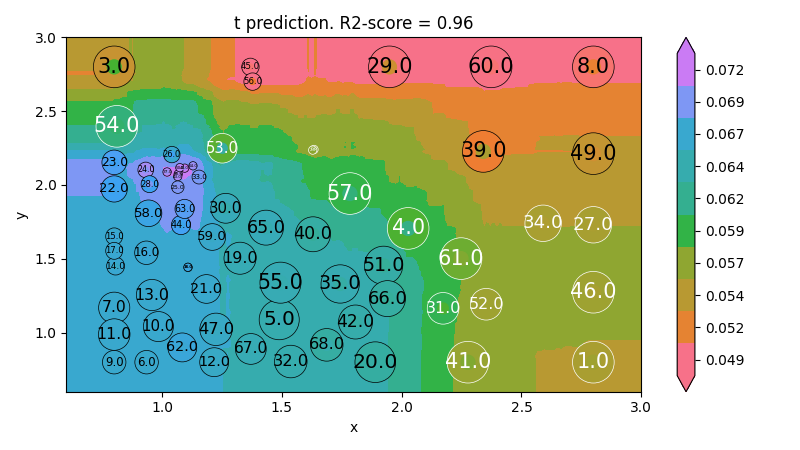

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9566590052519054, 'MAE': 0.0008025619027018577, 'MAX': 0.005858492760215439, 'RMSE': 0.0012789744235042705, 'R2-score interval': array([0.93049095, 0.97297558]), 'RMSE interval': array([0.00109773, 0.00153246]), 'MAE interval': array([0.0005634 , 0.00104172])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



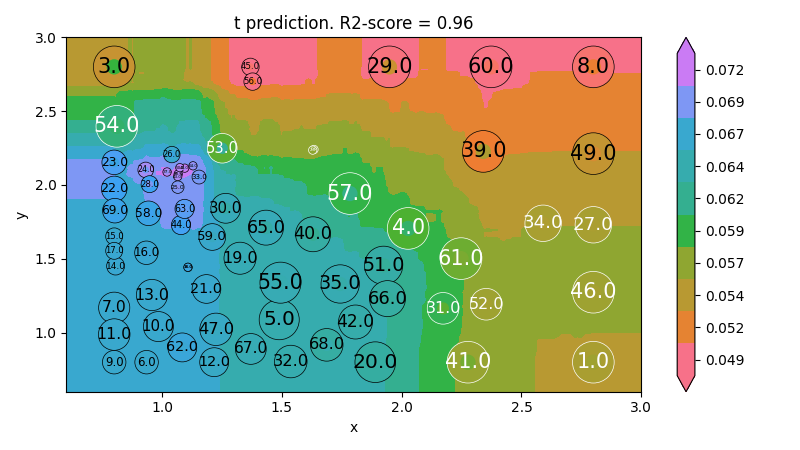

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9563460960815916, 'MAE': 0.0007845795305149298, 'MAX': 0.005578534740074623, 'RMSE': 0.0012750655346272163, 'R2-score interval': array([0.93022621, 0.97268798]), 'RMSE interval': array([0.00109547, 0.00152565]), 'MAE interval': array([0.00054498, 0.00102418])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



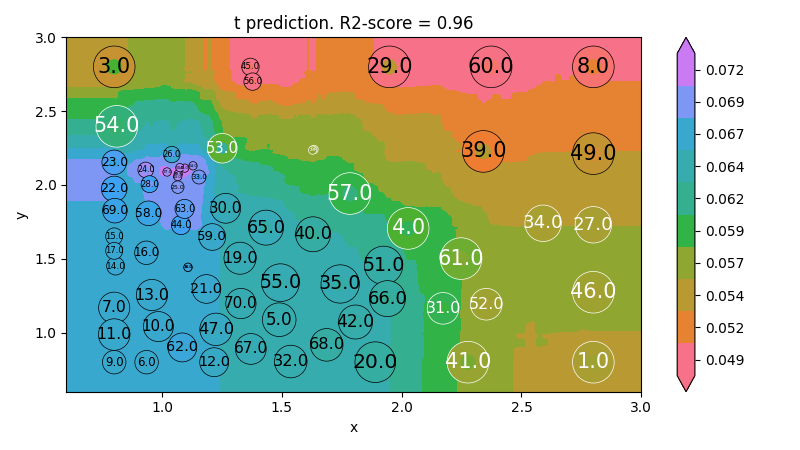

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9555880494557186, 'MAE': 0.000762903157493611, 'MAX': 0.005298576719933813, 'RMSE': 0.001277306688915072, 'R2-score interval': array([0.92924988, 0.9721213 ]), 'RMSE interval': array([0.00109847, 0.00152625]), 'MAE interval': array([0.00052048, 0.00100533])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



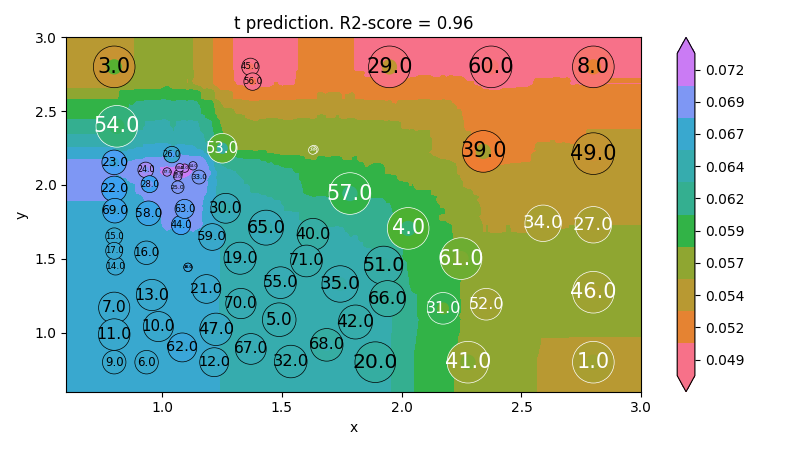

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9606716167956616, 'MAE': 0.0007180494569232413, 'MAX': 0.005298576719933813, 'RMSE': 0.0011937374434066834, 'R2-score interval': array([0.93755155, 0.97523202]), 'RMSE interval': array([0.00102758, 0.00142449]), 'MAE interval': array([0.00049401, 0.00094209])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



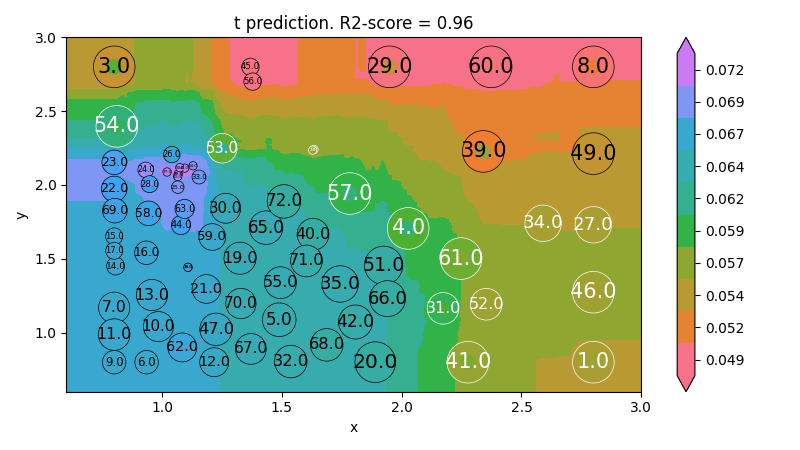

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9593720265002992, 'MAE': 0.0007010286699881935, 'MAX': 0.005578534740074623, 'RMSE': 0.001208062043738641, 'R2-score interval': array([0.93569301, 0.97433199]), 'RMSE interval': array([0.00104089, 0.00143971]), 'MAE interval': array([0.00047153, 0.00093053])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



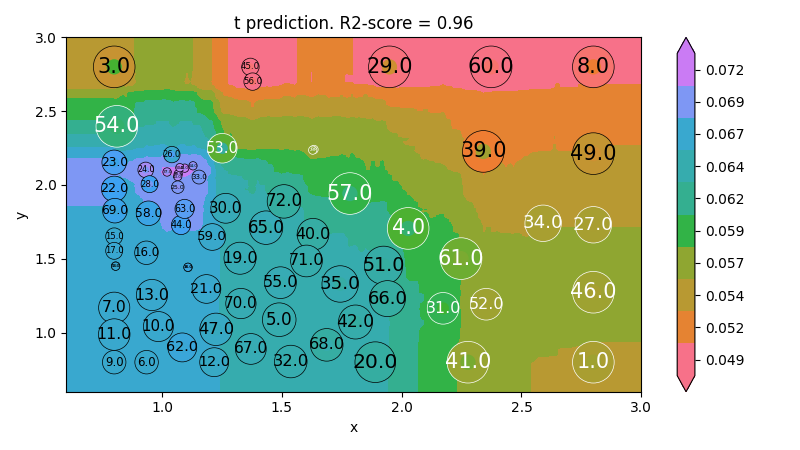

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9636609404945942, 'MAE': 0.0007034688001872263, 'MAX': 0.005858492760215439, 'RMSE': 0.0011581031058332182, 'R2-score interval': array([0.94266072, 0.97696994]), 'RMSE interval': array([0.00099876, 0.00137841]), 'MAE interval': array([0.00049038, 0.00091656])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



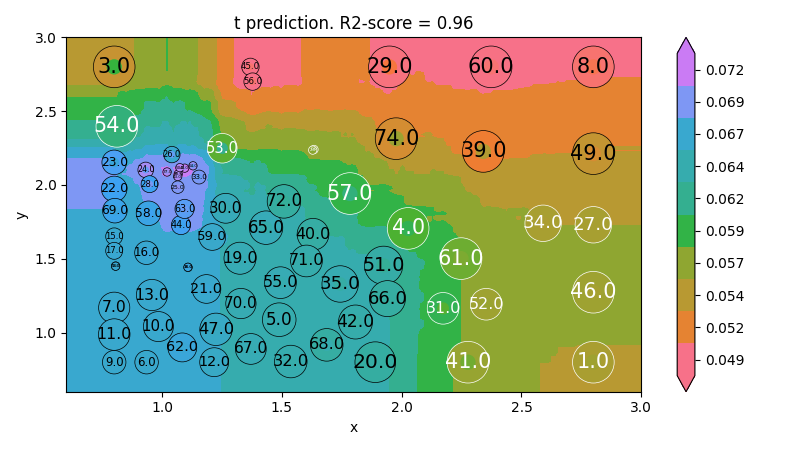

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9607551364220566, 'MAE': 0.0007228172521098472, 'MAX': 0.00529857671993382, 'RMSE': 0.001199332230543857, 'R2-score interval': array([0.93826461, 0.97505225]), 'RMSE interval': array([0.00103526, 0.0014257 ]), 'MAE interval': array([0.00050267, 0.00094296])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



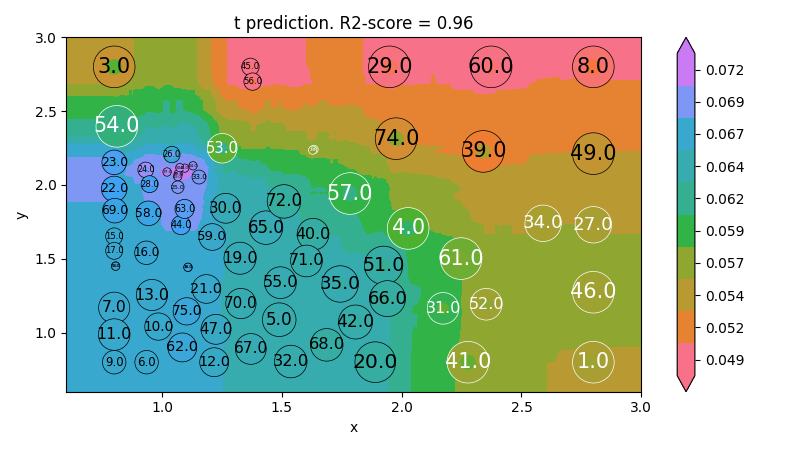

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9631102570831362, 'MAE': 0.0007248348642379848, 'MAX': 0.005298576719933813, 'RMSE': 0.0011568437426738567, 'R2-score interval': array([0.94214297, 0.97647904]), 'RMSE interval': array([0.00099947, 0.00137351]), 'MAE interval': array([0.00051885, 0.00093082])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



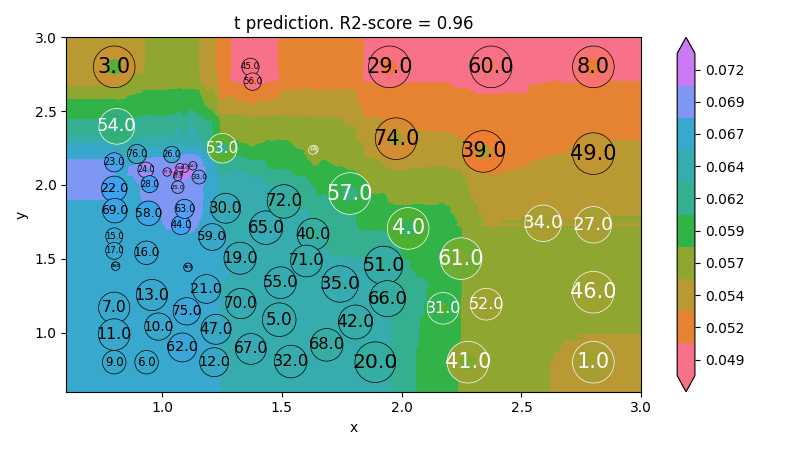

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9645161334590467, 'MAE': 0.0006776673696643451, 'MAX': 0.005858492760215439, 'RMSE': 0.0011273217928875333, 'R2-score interval': array([0.94451111, 0.97730889]), 'RMSE interval': array([0.00097481, 0.00133685]), 'MAE interval': array([0.00047323, 0.0008821 ])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



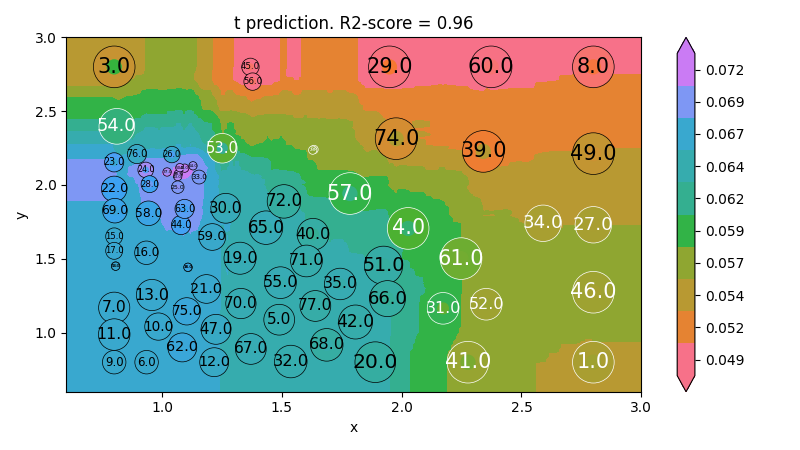

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9593455550124708, 'MAE': 0.0007282059933657797, 'MAX': 0.005578534740074623, 'RMSE': 0.001199116756814848, 'R2-score interval': array([0.9366083 , 0.97392744]), 'RMSE interval': array([0.00103778, 0.00142032]), 'MAE interval': array([0.00051345, 0.00094296])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



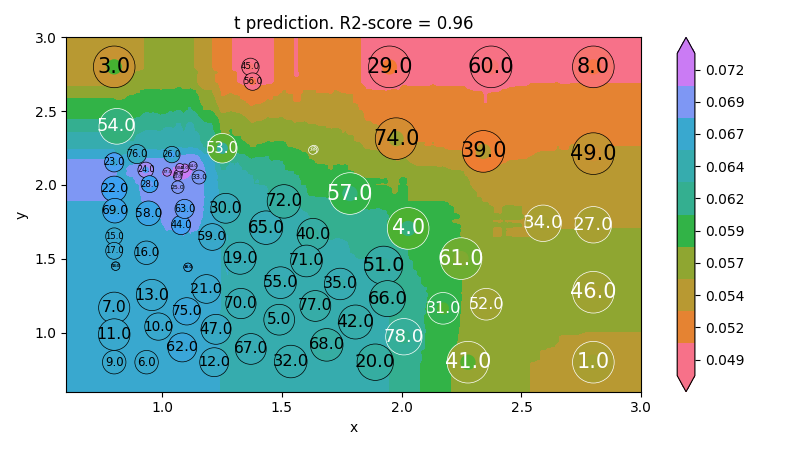

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9577721614078979, 'MAE': 0.0007306280556550055, 'MAX': 0.005298576719933813, 'RMSE': 0.0012298539911775395, 'R2-score interval': array([0.93434069, 0.97284177]), 'RMSE interval': array([0.00106528, 0.00145505]), 'MAE interval': array([0.00050908, 0.00095218])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



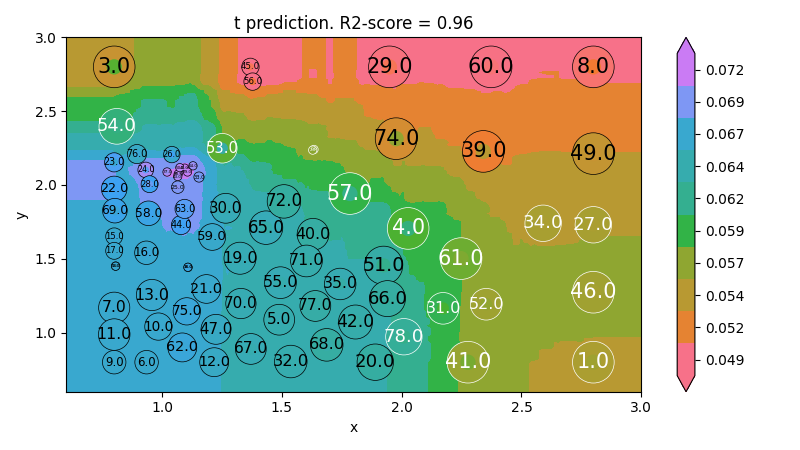

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9608086569988536, 'MAE': 0.0007202938950095089, 'MAX': 0.005298576719933813, 'RMSE': 0.001212872072635181, 'R2-score interval': array([0.93923076, 0.97472469]), 'RMSE interval': array([0.00105143, 0.00143334]), 'MAE interval': array([0.00050318, 0.00093741])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



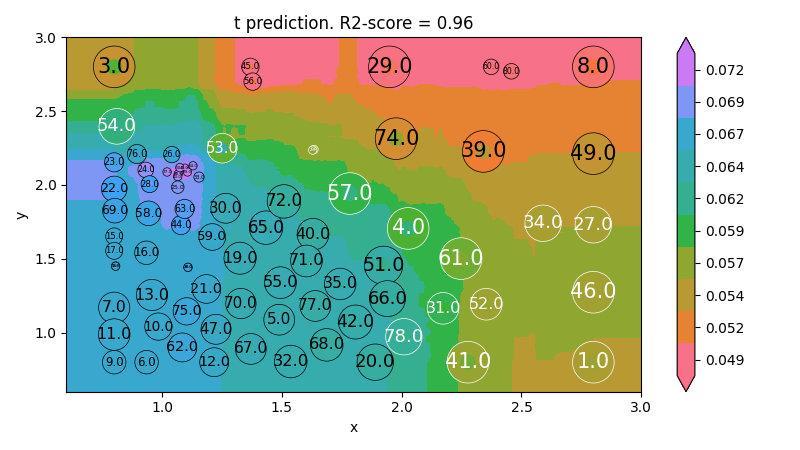

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9640260958939518, 'MAE': 0.0007037881147534662, 'MAX': 0.005578534740074623, 'RMSE': 0.0011580969480128548, 'R2-score interval': array([0.94437118, 0.97673649]), 'RMSE interval': array([0.00100476, 0.00136709]), 'MAE interval': array([0.00050046, 0.00090711])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



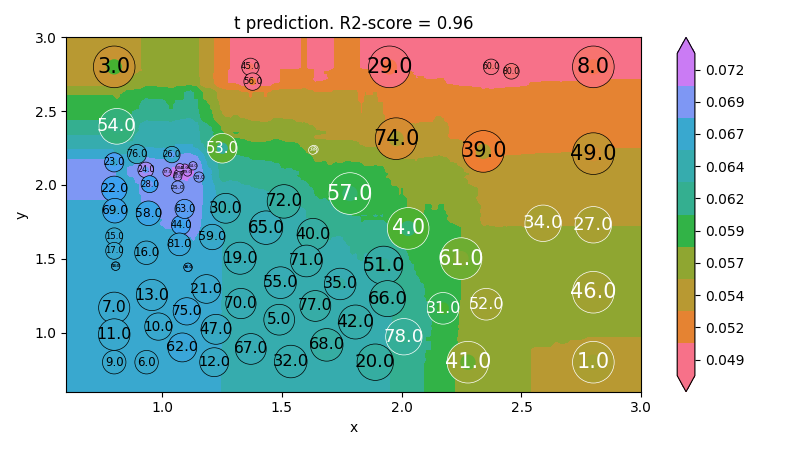

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9610234289660783, 'MAE': 0.0007785435088278104, 'MAX': 0.005080954838459148, 'RMSE': 0.0012069335092598041, 'R2-score interval': array([0.93988869, 0.97472733]), 'RMSE interval': array([0.00104797, 0.0014232 ]), 'MAE interval': array([0.00057594, 0.00098115])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



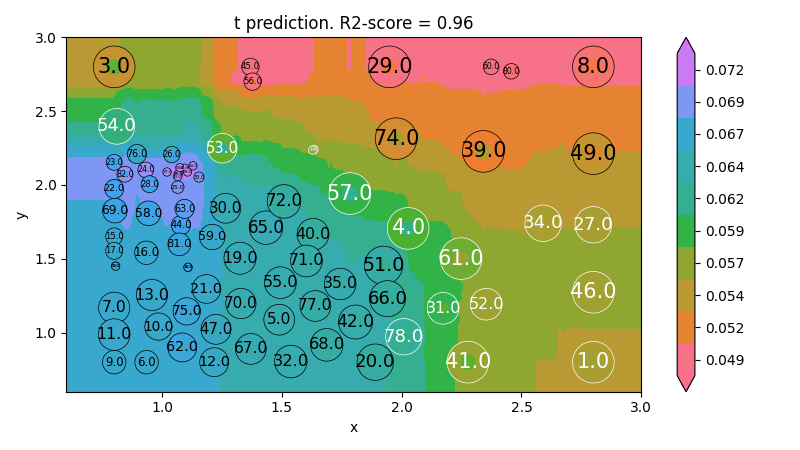

Try predict by: ['x', 'y']
t - regression score: {'R2-score': 0.9592190312727042, 'MAE': 0.0007839052883558571, 'MAX': 0.004662301375102186, 'RMSE': 0.001233757128226484, 'R2-score interval': array([0.93727055, 0.97348793]), 'RMSE interval': array([0.0010721 , 0.00145328]), 'MAE interval': array([0.00057591, 0.0009919 ])}+-{'R2-score': 0.0, 'MAE': 0.0, 'MAX': 0.0, 'RMSE': 0.0, 'R2-score interval': array([0., 0.]), 'RMSE interval': array([0., 0.]), 'MAE interval': array([0., 0.])}



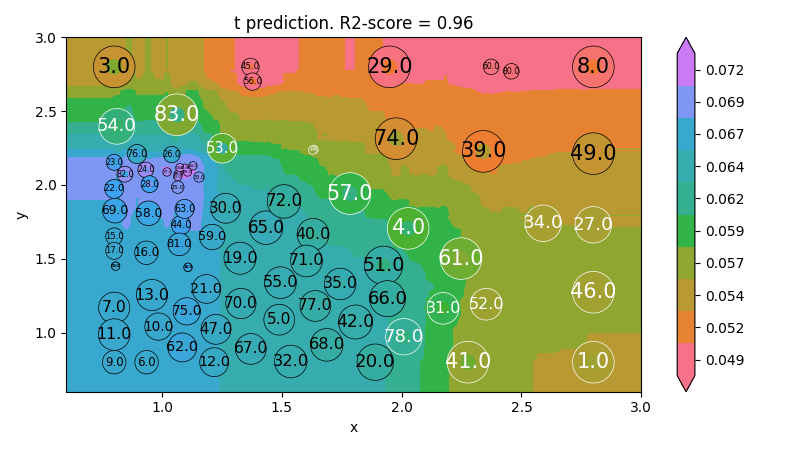

KeyboardInterrupt: 

In [7]:
for i in range(150):
    aaa+=1
    update(fig, False,aaa)

In [ ]:
from bayes_opt import UtilityFunction

utility = UtilityFunction(kind="ucb", kappa=2.5, xi=0.0)
next_point_to_probe = optimizer.suggest(utility)
print("Next point to probe is:", next_point_to_probe)

In [ ]:
for _ in range(10):
    next_point = optimizer.suggest(utility)
    print(next_point)

    target = target_function(next_point.get("x"),next_point.get('y'))
    print(target)

    optimizer.register(params=next_point, target=target)
    
  #  print(target, next_point)
print(optimizer.max)